In [10]:
from utils import *

# Final Project Submission

Please fill out:
* Student name: Marco Giuseppe Nasuto
* Student pace: self paced
* Scheduled project review date/time: 
* Instructor name: Jeff Herman
* Blog post URL: https://deepamazon.marconasuto.com/

# Project description
The strategic development planning of a region is a highly interdisciplinary task that requires a set of tools,  competencies, people and timing, to come up with a political vision of the future of a region. Any modern development strategy should be thought within the sustainable development framework, which has at the core the concept of sustainability (human, social , economical, environmental). The field is obviously very complex due to internal, regional conditions, and external factors, as regions are dynamic, interconnected systems. A thorough analysis require both an enormous, etherogeneous (as the problem is multi-faceted) amount of data, and a substantial degree of synthesis of this information, in order to distill insights and make them actionable. Machine learning offers the chance and the hope to leverage on this data and transform it into information. Often digitalization is misconcieved as de-materialization, something closer to magic than reality. Every digital activity has a physical aspect/process somewhere along its supply chain, that can be described by a set of features and, by being physical, it can be  displayed on a map. Remote sensing data is key for geospatial analysis, especially within the context of strategic development planning of a region. One of the building blocks of a system able to track and analyse objects from RS images, is to detect and classify them. Althopugh in rapid development, deep learning, a subfield of machine learning that showed impressive applications on computer vision tasks, has not being applied extensively to remote sensing images with respect to other type of imageries, yet.



Within this context, as part of my educational path at Flatiron School - Data Science, for my fifth portfolio project I wanted to learn and develop deep learning models able to do automated multi-label classification of Remote Sensing (RS) imagery according to land use to 1) help us to track and, hopefully, plan solutions to unsustainble human damages to ecosystems; 2) help us building a log of land use/land cover for locations; 3) measure the results of conservation or encroachments. 



One of the most symbolic, endangered areas, where strategic sustainable development planning is not only key, but has also an impact on a global scale, is the Amazon basin. Since the greatest majority of the basin belongs to Brazil, I will focus on the Brazilian side. Brazilians have always seen the Amazon basin as a potential, enormous resource of wealth. Due to strategic reasons, the extension, the natural resources, and at the same time the impenetrability of the rainforest (seen as an hazard from a military point of view), were subject to mega-projects. This type of development model has not only devastating downsides on the environment, but also shows economical criticalities in terms of growth. Alternatives to mega-projects have been implemented only in the last 25 years. Sustainable development follows different paradigms, the main one is a slower but more stable growth rate. An interesting and successful example of sustainable business in the Brazialian Amazon, is the project Castanha-do-Brasil. In the Business understanding section, I did a short literature review on the topic. 



In 2017, Planet, designer and builder of the world’s largest constellation of Earth-imaging satellites, launched a challenge on Kaggle, offering an interesting dataset of satellite images of the Amazon basin with a 3 - 5 meter resolution. There are 17 unbalanced labels in total: 4 labels for the atmospheric conditions, 13 labels land cover/land use. Technically, the task of this project consists of building a multi-label, land cover/land use and atmospheric conditions classifier (in other words a scene classifier) leveraging on deep learning architectures, in particular CNNs.



In September , 2020 became the most active fire year in the southern Amazon since 2012*(the year that the VIIRS sensor was launched on the Suomi-NPP satellite). The majority of fires occur due to regional deforestation. In August 2019, a research by the National Institute for Space Research (INPE) revealed an 84 percent increase in Amazon forest fires compared to 2018. Bolsonaro and its establishment fired the Head of INPE due to tracking Amazon deforastation.



After framing Business understanding, I scoped the project to offer recommendations to the the following initial questions: 1) Can help tracking the exploitation of the Amazon basin in a more efficient way (i.e. less manual working)? 2) Where are located the majority of fires? 3) Can this tool be potentially used for verifying deforestation alerts?. 4) Can this tool used to certify sustainability of a business operating in the Amazon? After doing a literature review, that can be found in Related works, I did a quick Exploratory Data Analysis on the dataset first. To enrich the analysis (map above and fig. 1) , I also used RS VIIRS I-Band 375 m Active Fire Data on active fires in 2019 in Brazil, and several geospatial data on the Amazon basin (updated to 2020) from Amazonia Socioambiental,  to create a map of the Amzon basin with different data layers to get a quick overview.



In the initial Kaggle competition, ranking was based on average F2 score, which is a Fbeta score 'focued' on recall, hence on minimisizng the number of false negatives. I approached the problem doing a literature review on several topics, rather than going 'plug-and-play' approach.

Once done with the EDA, 1) I created a baseline CNN, adding levels of complexity through some iterations (i.e. input shape, number of samples, depth and complexity of the model, optimizers etc.), based on training and validation metrics, in my case f2-score and loss. 2) I used a pre-trained architecture (ResNet50 as it offer a good trade-off between accuracy and computational complexity), unfreezing first only the top layers (fine-tuning), than trying training from scratch on the entire training set .

Due to strong computational and time constraints (as part of the project requirements, the final scripts must be ran at max overnight on a local machine - in my case a MacBook Pro mid 2015), max f2 score achieved was 89%, 3% less than state-of-the-art.


# Data retrieval

The Kaggle dataset that I used in this project is a set of 40,479 satellite imagery of the Amazon Basin that was collected over a 1-year span starting in 2016. The dataset was provided by Planet. Each image is 256x256x4 in a 4-channel(RGB+near-IR) TIFF format. I had also to download the dataset with images in jpeg format, as explained later. There are 17 classes andeach image can belong to multiple classes. The labels canbroadly be broken into three groups: weather conditions,common land cover/land use, and rareland cover/land use. The weather conditionslabels are: clear, cloudy, partly cloudy, and haze. The commonland labels are: primary, agriculture, cultivation, habitation,water and roads. The rare labels are: slash-and-burn, selectivelogging, blooming, bare ground, conventional mining,artisinal mining, and blow-down. It is evident from the distribution of labels across training images (fig.2) that this project presents challenges due to class imbalance. Fig.3, 4, 5, show co-occurence matrices of labels, which help understanding some patterns: weather labels are mutually exclusive; commonlabels have heavy overlap whereas rare labels have very minimal overlap. In addition, we calculated the normalized difference vegetation index (NDVI) and green NDVI (GNDVI) for all datasets as the inclusion of vegetation indices previously has been shown to improve the performance of CNN models applied to UAV orthogonal images, trained on small datasets. NDVI and GNDVI were derived from image bands using the following equations:

I didn't use the following cell to download the datasets directly from jupyter notebook as, once unzipped, there are two torrent files: 1) I had technical issues using them 2) I found out that they allow you to download only the tif version of the dataset. We need also the jpg. Therefore, please proceed with manual download:

In [7]:
#!kaggle competitions download -c planet-understanding-the-amazon-from-space

In [2]:
# manually download datasets files https://www.kaggle.com/c/planet-understanding-the-amazon-from-space/data?select=train-tif-v2
#                         https://www.kaggle.com/c/planet-understanding-the-amazon-from-space/data?select=train-jpg
#                         https://www.kaggle.com/c/planet-understanding-the-amazon-from-space/data?select=train_v2.csv
# and save them in ./data/raw/

In [2]:
assets_path = './reports/assets/'
saved_models_dir = './reports/saved_models'
saved_models_tmp_dir = './reports/saved_models/tmp'
log_folder = './reports/logs'
log_gradient_tape_path = os.path.join(log_folder, 'gradient_tape')
log_cm_path = os.path.join(log_folder, 'cm')
raw_data_dir = './data/raw/train/train-tif-v2'
train_data_dir = './data/train'
val_data_dir = './data/val'
test_data_dir = './data/test'
assets_path = './reports/assets/'

mkdir('data')
mkdir('./data/raw')
mkdir('./data/raw/train')
mkdir('reports')
mkdir(train_data_dir)
mkdir(test_data_dir)
mkdir(val_data_dir)                             
mkdir(log_folder)
mkdir(log_gradient_tape_path)
mkdir(log_cm_path)   
mkdir(assets_path)
mkdir(saved_models_dir)
mkdir(saved_models_tmp_dir)

In [3]:
mkdir('./data/raw/train/jpg')

In [99]:
#with py7zr.SevenZipFile('./data/raw/train-jpg.tar.7z', 'r') as z:
   # z.extractall('./data/raw/train/jpg')

In [107]:
#with tarfile.open('./data/raw/train/jpg/train-jpg.tar', 'r') as z:
  #  z.extractall('./data/raw/train/jpg')

In [12]:
#with py7zr.SevenZipFile('./data/raw/train-tif-v2.tar.7z', 'r') as z:
#    z.extractall('./data/raw/train')

In [13]:
#with tarfile.open('./data/raw/train/train-tif-v2.tar', 'r') as z:
#    z.extractall('./data/raw/train/')

# Load data and EDA

In [4]:
df = pd.read_csv('./data/raw/train_v2.csv/train_v2.csv')

In [5]:
df.head()

,image_name,tags
0,train_0,haze primary
1,train_1,agriculture clear primary water
2,train_2,clear primary
3,train_3,clear primary
4,train_4,agriculture clear habitation primary road


In [6]:
df.shape

(40479, 2)

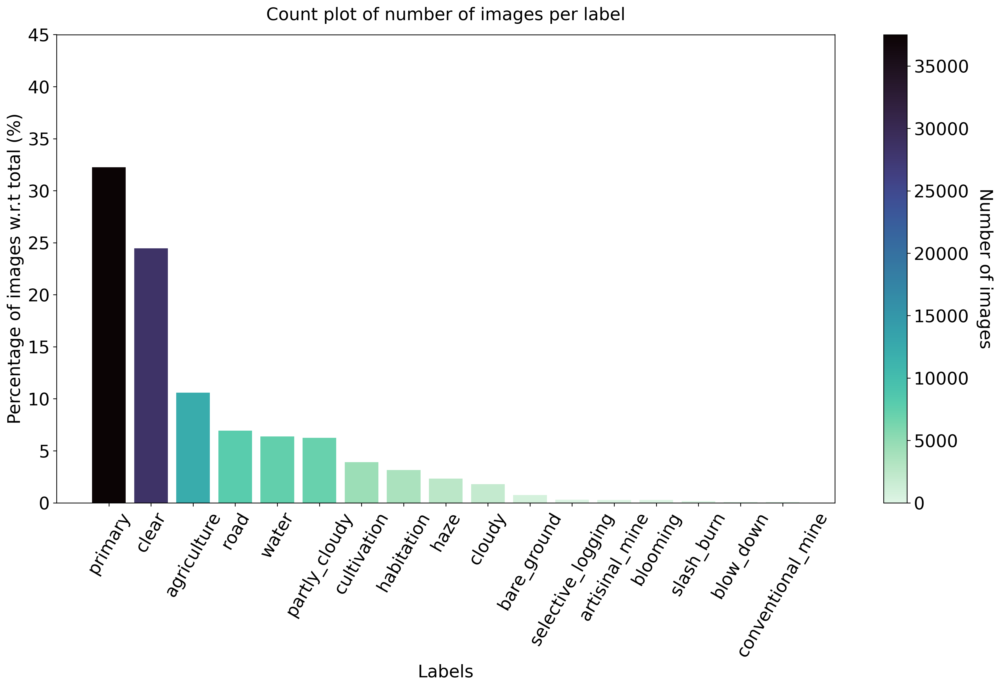

In [20]:
# split tags in unique tags, count tags, get bar plot

split_tags = [row.split(' ') for row in df['tags']]
tags_flattened = [sub_el for el in split_tags for sub_el in el ]
count_tags = dict(sorted(Counter(tags_flattened).items(), key= lambda x: x[1], reverse=True))
tags = set(tags_flattened)

#plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 10
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18

palette = plt.get_cmap(sns.color_palette("mako_r", as_cmap=True))
plt.bar(count_tags.keys(), percentage(count_tags), color=palette(cmap_rescale(count_tags)))
plt.yticks(ticks=np.arange(0, 50, 5))

data_color = count_tags.values()
sm = ScalarMappable(cmap=palette, norm=plt.Normalize(0,max(data_color)))
sm.set_array([])

cbar = plt.colorbar(sm)
cbar.set_label('Number of images', rotation=270, labelpad=25, size=18)

title = 'Count plot of number of images per label'

plt.xticks(rotation=60);
plt.xlabel('Labels', size=18)
plt.ylabel('Percentage of images w.r.t total (%)', size=18)
plt.title(title, size=18, pad=15)
plt.tight_layout()
plt.savefig(os.path.join(assets_path, title + '.png'))

In [6]:
mlb = MultiLabelBinarizer()
df_4gen = pd.concat([df.drop('tags', axis=1), pd.DataFrame(mlb.fit_transform(df.tags.map(lambda x: x.split(' '))), columns=mlb.classes_)],axis=1)

In [7]:
df_4gen = df_4gen.rename(columns={'image_name':'filename'})
df_4gen['filename'] = df_4gen['filename'].map(lambda x: x + '.jpg')

In [8]:
columns = [el for el in df_4gen.columns if el != 'filename']

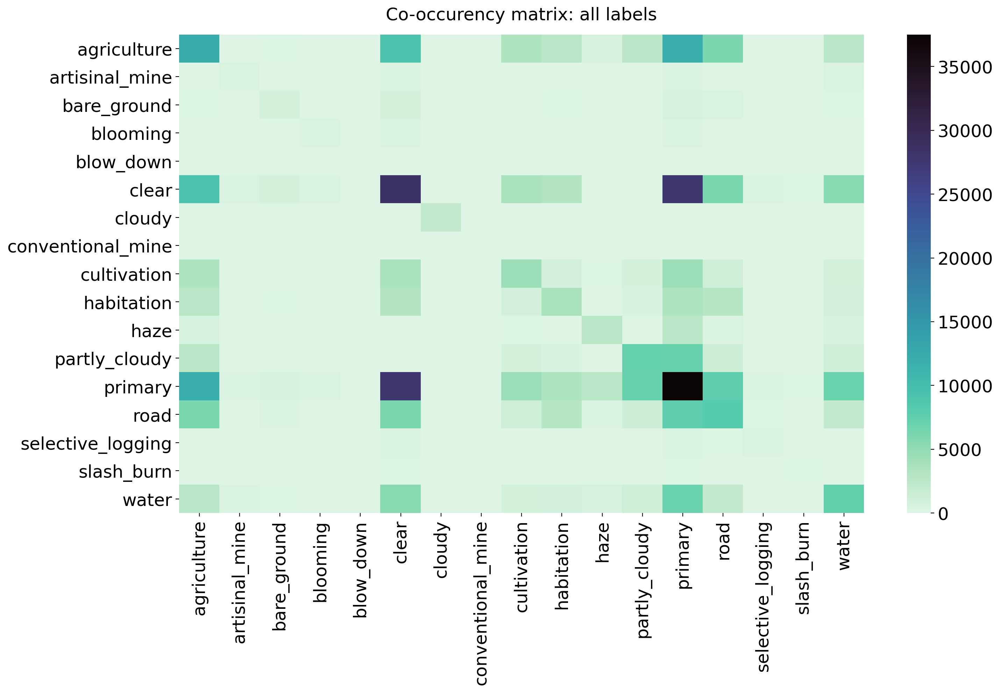

In [49]:
# Compute the co-ocurrence matrix
co_oc_matrix = make_cooccurence_matrix(df_4gen, columns, 'all labels')

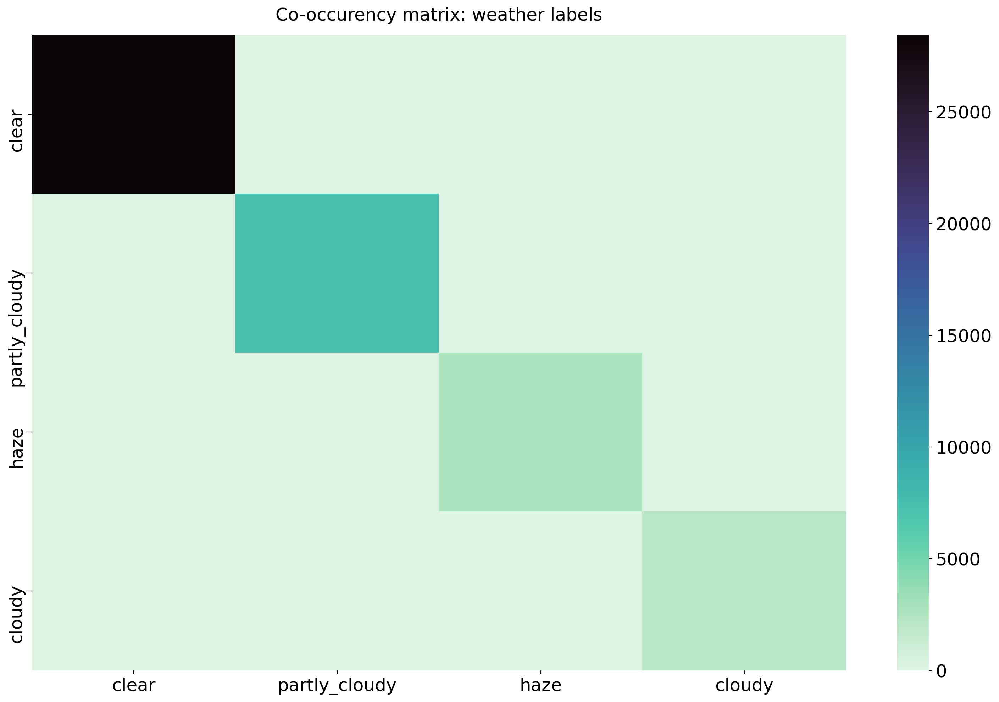

In [25]:
weather_labels = ['clear', 'partly_cloudy', 'haze', 'cloudy']
weather_co_oc = make_cooccurence_matrix(df_4gen, weather_labels, 'weather labels')

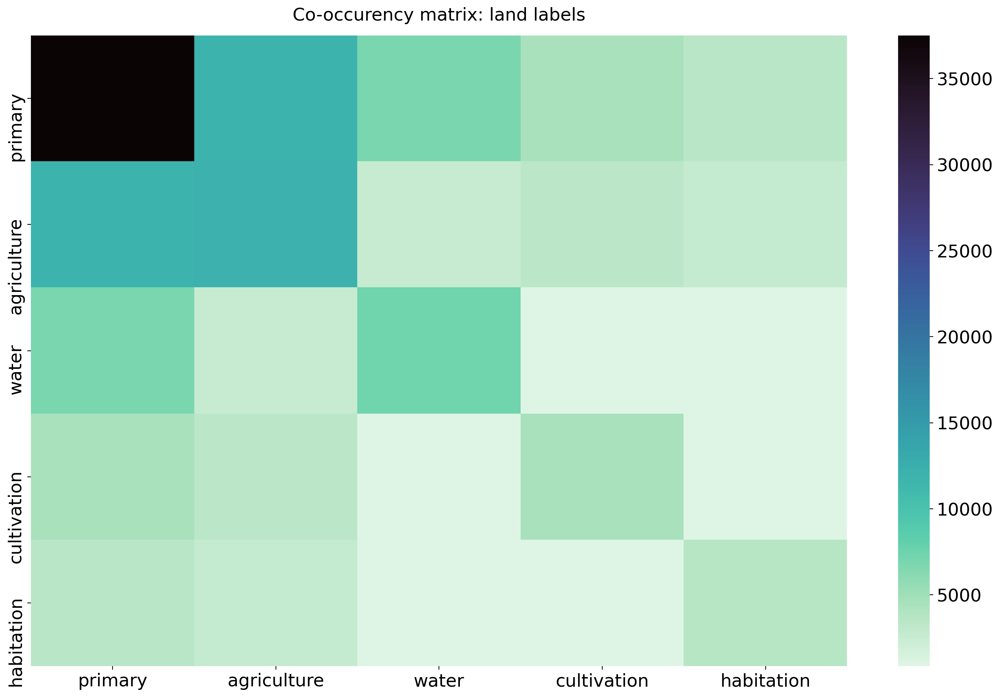

In [26]:
land_labels = ['primary', 'agriculture', 'water', 'cultivation', 'habitation']
land_co_oc = make_cooccurence_matrix(df_4gen, land_labels, 'land labels')

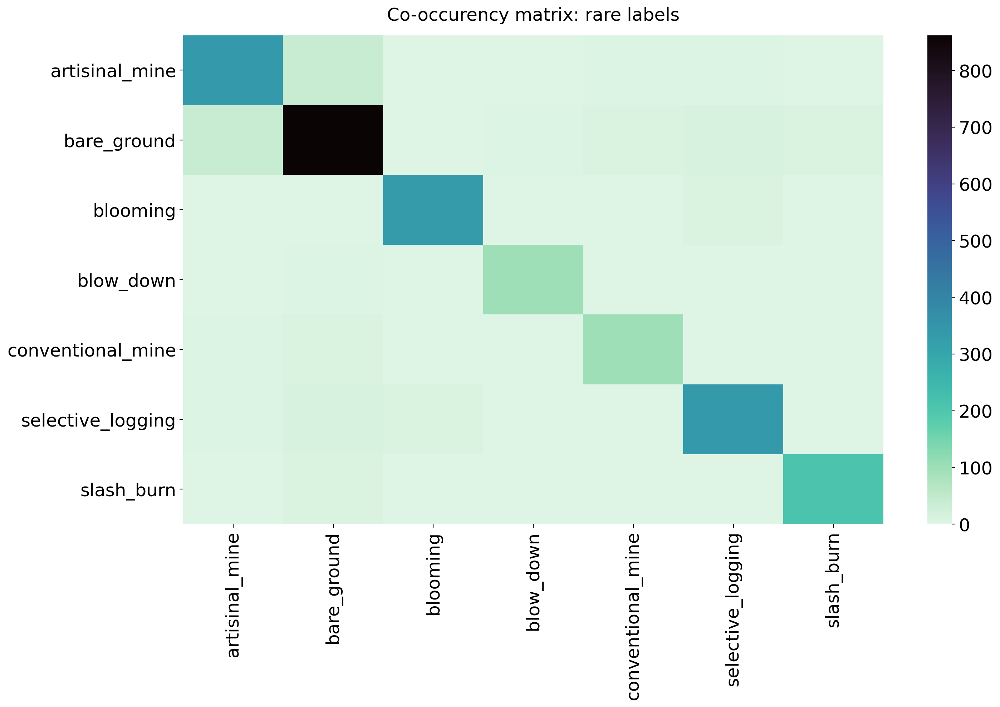

In [27]:
rare_labels = [label for label in columns if df_4gen[columns].sum()[label] < 2000]
rare_labels_co_oc = make_cooccurence_matrix(df_4gen, rare_labels, 'rare labels')

In [10]:
# TensorBoard logs for train, val, test 

%load_ext tensorboard
#!rm -rf ./logs/
    
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

train_log_dir = log_gradient_tape_path + current_time + '/train'
val_log_dir = log_gradient_tape_path + current_time + '/val'
test_log_dir = log_cm_path + current_time + '/test'

train_summary_writer = tf.summary.create_file_writer(train_log_dir)
val_summary_writer = tf.summary.create_file_writer(val_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)
summary_writer = tf.summary.create_file_writer(log_folder)

In [9]:
# create lists of filenames, labels and filenames_img for train, val, test set (default percentage 100% of dataset)
train_val_test, train_val_test_labels, data_filenames_img = create_filenames_labels(df)

3it [00:20,  6.73s/it]
3it [00:00, 35.89it/s]


Total number of samples (train + val + test) (100 % of original dataset) : 40479
Training set - number of samples: 25501
Validation set - number of samples: 10930
Test set - number of samples: 4048
Training set - number of samples in .data/train: 25502
Validation set - number of samples .data/val: 10931
Test set - number of samples .data/test: 4049


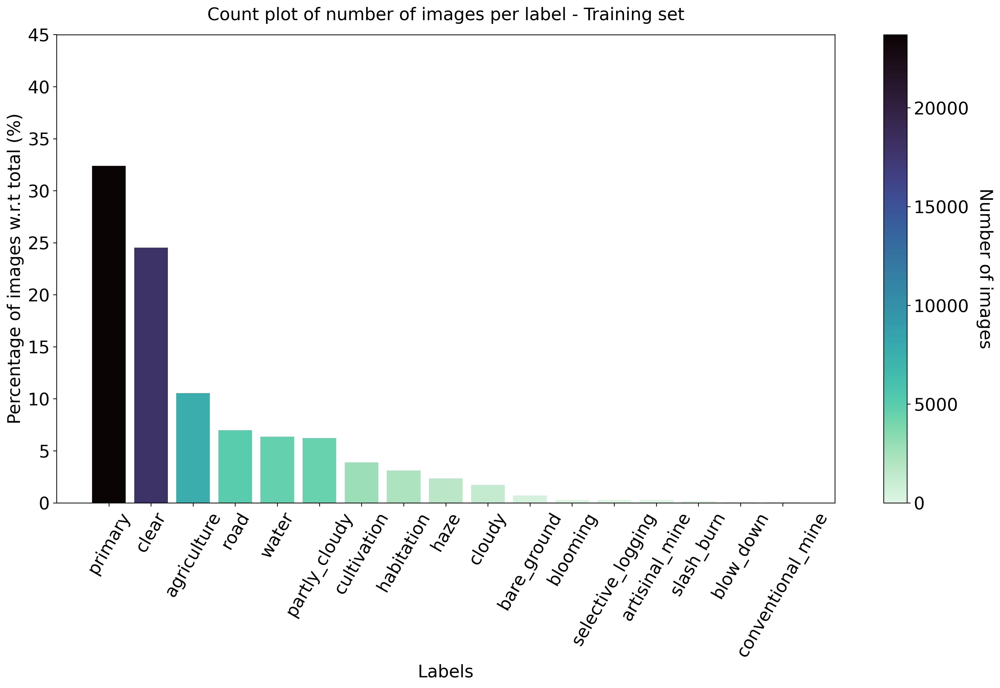

In [119]:
# split tags in unique tags, count tags, get bar plot
split_tags_train = [row.split(' ') for row in df[df['image_name'].isin([x.split('.jpg')[0] for x in data_filenames_img[0]])]['tags']]
tags_flattened_train = [sub_el for el in split_tags_train for sub_el in el ]
count_tags_train = dict(sorted(Counter(tags_flattened_train).items(), key= lambda x: x[1], reverse=True))
tags_train = set(tags_flattened_train)

#plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 10
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18

palette = plt.get_cmap(sns.color_palette("mako_r", as_cmap=True))
plt.bar(count_tags_train.keys(), percentage(count_tags_train), color=palette(cmap_rescale(count_tags_train)))
plt.yticks(ticks=np.arange(0, 50, 5))

data_color = count_tags_train.values()
sm = ScalarMappable(cmap=palette, norm=plt.Normalize(0,max(data_color)))
sm.set_array([])

cbar = plt.colorbar(sm)
cbar.set_label('Number of images', rotation=270, labelpad=25, size=18)

title = 'Count plot of number of images per label - Training set'

plt.xticks(rotation=60);
plt.xlabel('Labels', size=18)
plt.ylabel('Percentage of images w.r.t total (%)', size=18)
plt.title(title, size=18, pad=15)
plt.tight_layout()
plt.savefig(os.path.join(assets_path, title + '.png'))#

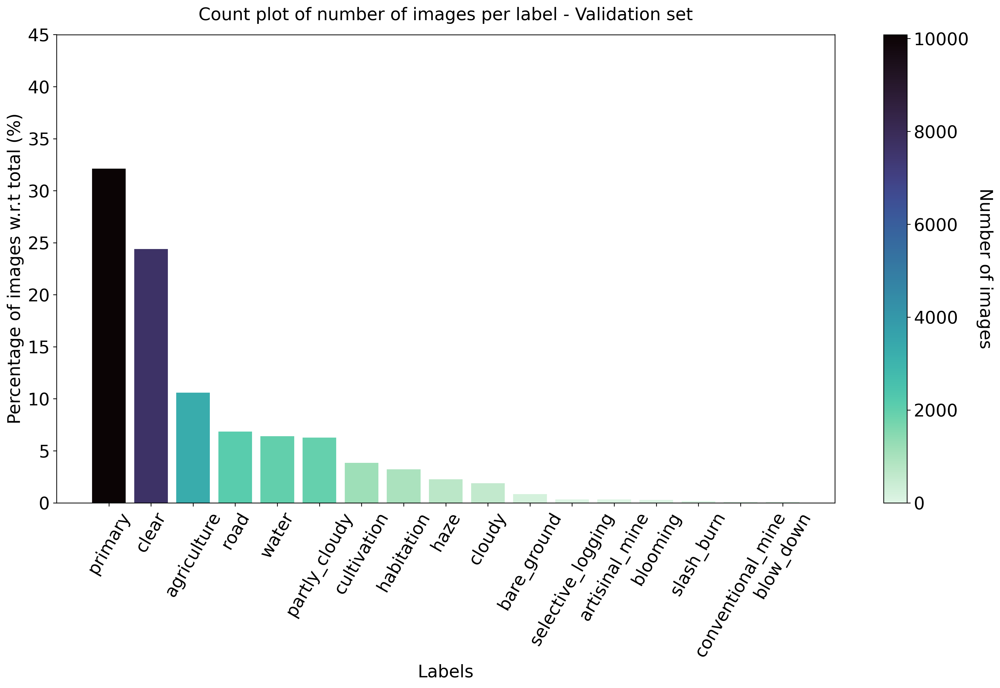

In [120]:
# split tags in unique tags, count tags, get bar plot
split_tags_val = [row.split(' ') for row in df[df['image_name'].isin([x.split('.jpg')[0] for x in data_filenames_img[1]])]['tags']]
tags_flattened_val = [sub_el for el in split_tags_val for sub_el in el ]
count_tags_val = dict(sorted(Counter(tags_flattened_val).items(), key= lambda x: x[1], reverse=True))
tags_val = set(tags_flattened_val)

#plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 10
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18

palette = plt.get_cmap(sns.color_palette("mako_r", as_cmap=True))
plt.bar(count_tags_val.keys(), percentage(count_tags_val), color=palette(cmap_rescale(count_tags_val)))
plt.yticks(ticks=np.arange(0, 50, 5))

data_color = count_tags_val.values()
sm = ScalarMappable(cmap=palette, norm=plt.Normalize(0,max(data_color)))
sm.set_array([])

cbar = plt.colorbar(sm)
cbar.set_label('Number of images', rotation=270, labelpad=25, size=18)

title = 'Count plot of number of images per label - Validation set'

plt.xticks(rotation=60);
plt.xlabel('Labels', size=18)
plt.ylabel('Percentage of images w.r.t total (%)', size=18)
plt.title(title, size=18, pad=15)
plt.tight_layout()
plt.savefig(os.path.join(assets_path, title + '.png'))#

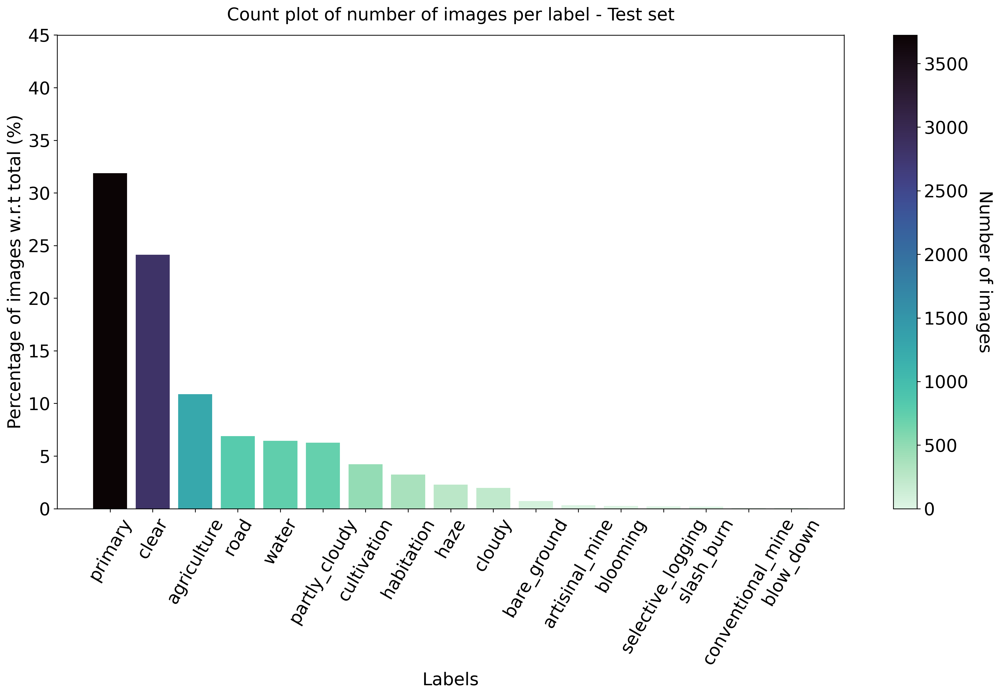

In [315]:
# split tags in unique tags, count tags, get bar plot
split_tags_test = [row.split(' ') for row in df[df['image_name'].isin([x.split('.jpg')[0] for x in data_filenames_img[2]])]['tags']]
tags_flattened_test = [sub_el for el in split_tags_test for sub_el in el ]
count_tags_test = dict(sorted(Counter(tags_flattened_test).items(), key= lambda x: x[1], reverse=True))
tags_test = set(tags_flattened_test)

#plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 10
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18

palette = plt.get_cmap(sns.color_palette("mako_r", as_cmap=True))
plt.bar(count_tags_test.keys(), percentage(count_tags_test), color=palette(cmap_rescale(count_tags_test)))
plt.yticks(ticks=np.arange(0, 50, 5))

data_color = count_tags_test.values()
sm = ScalarMappable(cmap=palette, norm=plt.Normalize(0,max(data_color)))
sm.set_array([])

cbar = plt.colorbar(sm)
cbar.set_label('Number of images', rotation=270, labelpad=25, size=18)

title = 'Count plot of number of images per label - Test set'

plt.xticks(rotation=60);
plt.xlabel('Labels', size=18)
plt.ylabel('Percentage of images w.r.t total (%)', size=18)
plt.title(title, size=18, pad=15)
plt.tight_layout()
plt.savefig(os.path.join(assets_path, title + '.png'))#

# Preprocessing

Option 1: Make it part of the model, like this:

        inputs = keras.Input(shape=input_shape)
        x = data_augmentation(inputs)
        x = layers.experimental.preprocessing.Rescaling(1./255)(x)
        ...  # Rest of the model
        
With this option, your data augmentation will happen on device, synchronously with the rest of the model execution, meaning that it will benefit from GPU acceleration.

Note that data augmentation is inactive at test time, so the input samples will only be augmented during fit(), not when calling evaluate() or predict().

If you're training on GPU, this is the better option.

Option 2: apply it to the dataset, so as to obtain a dataset that yields batches of augmented images, like this:

        augmented_train_ds = train_ds.map(
          lambda x, y: (data_augmentation(x, training=True), y))
          
With this option, your data augmentation will happen on CPU, asynchronously, and will be buffered before going into the model.

If you're training on CPU, this is the better option, since it makes data augmentation asynchronous and non-blocking.

In our case, we'll go with the first option.

In [11]:
ref_means, ref_stds = reference_calibration_values(train_val_test[0])

In [12]:
train_params, test_params = params(epochs=4,train_val_test=train_val_test, ref_means=ref_means, ref_stds=ref_stds)

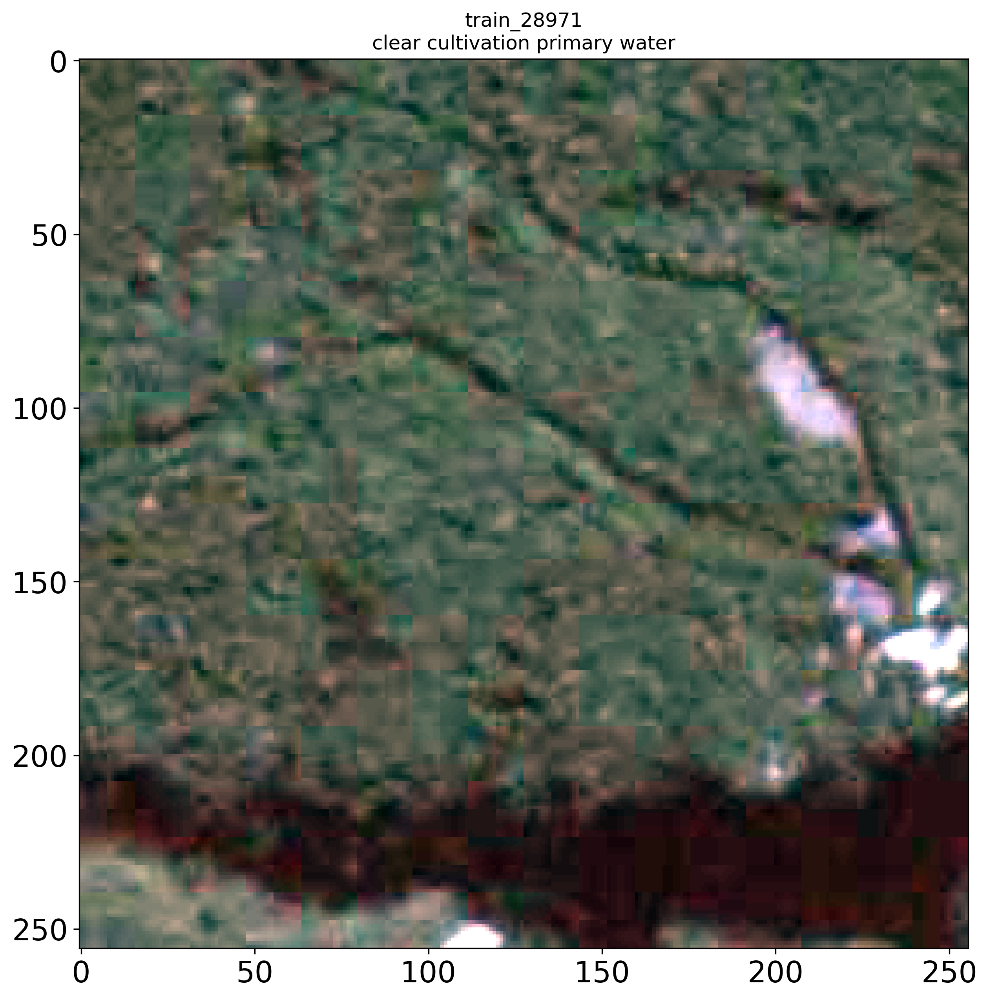

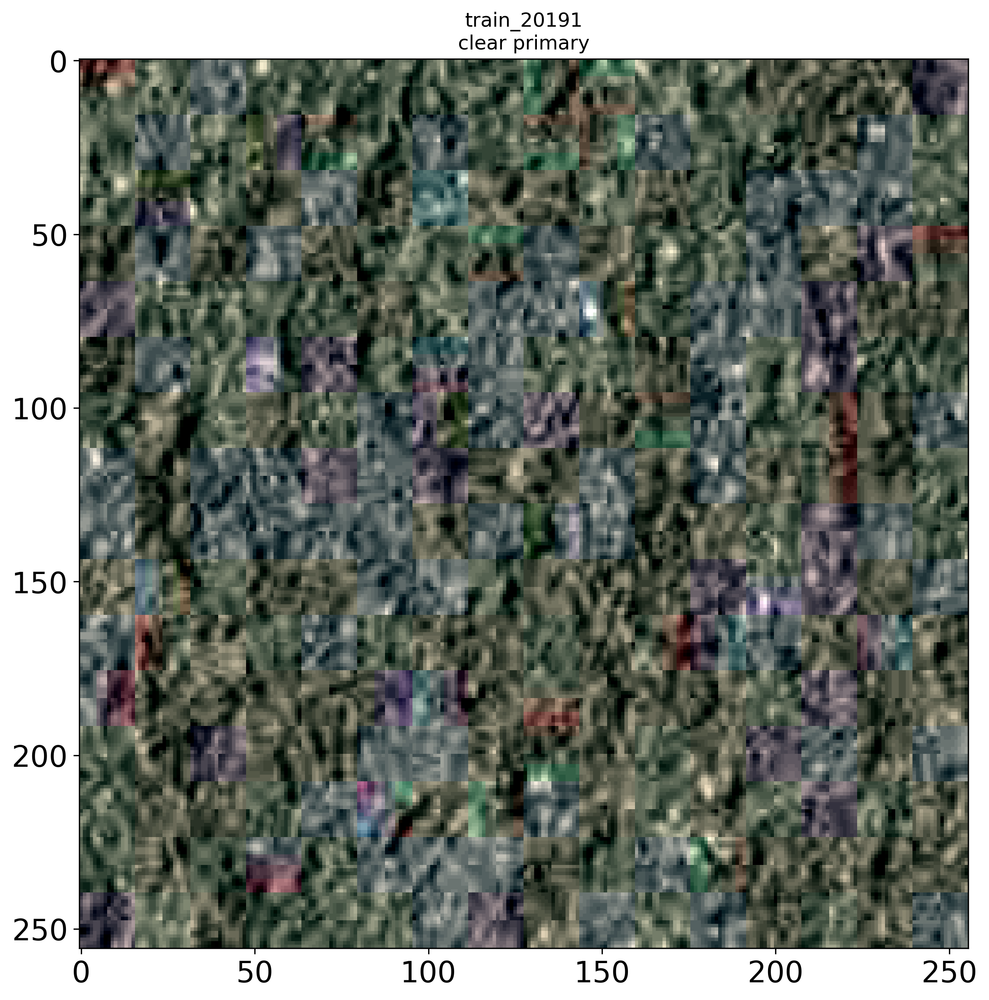

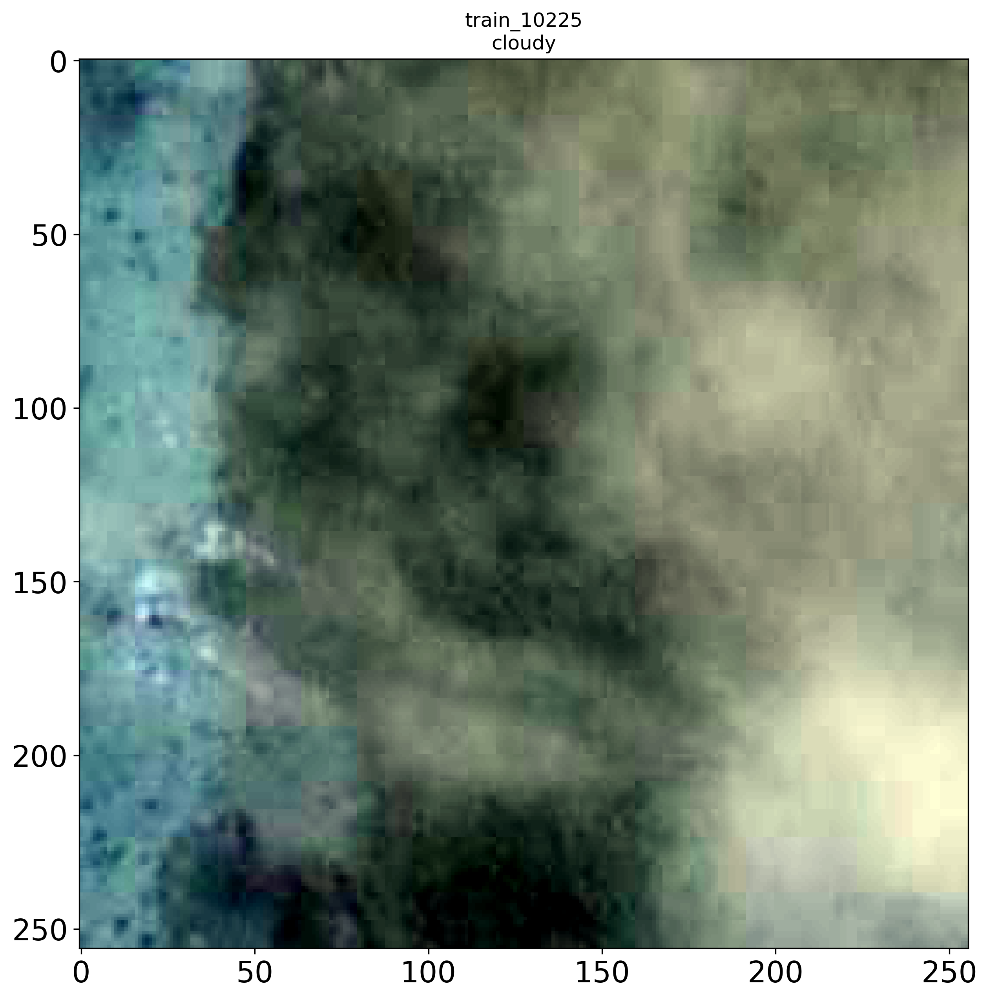

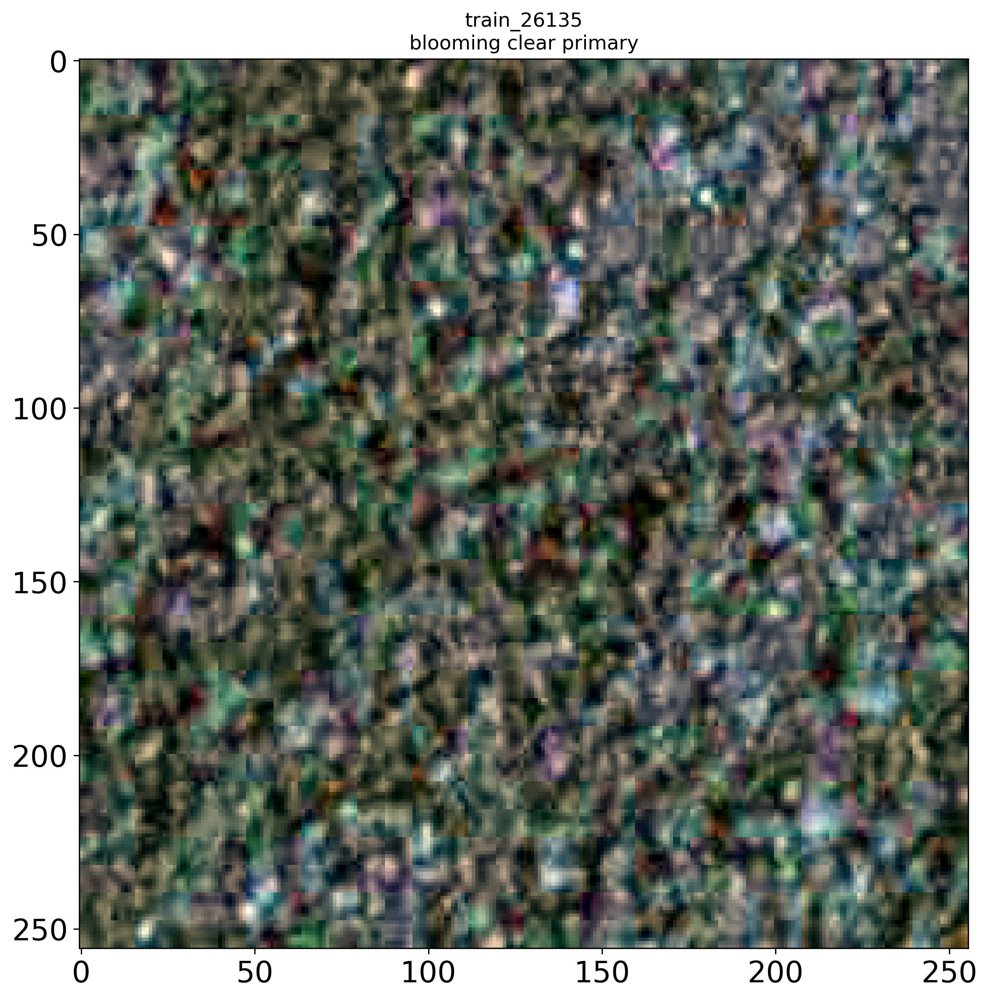

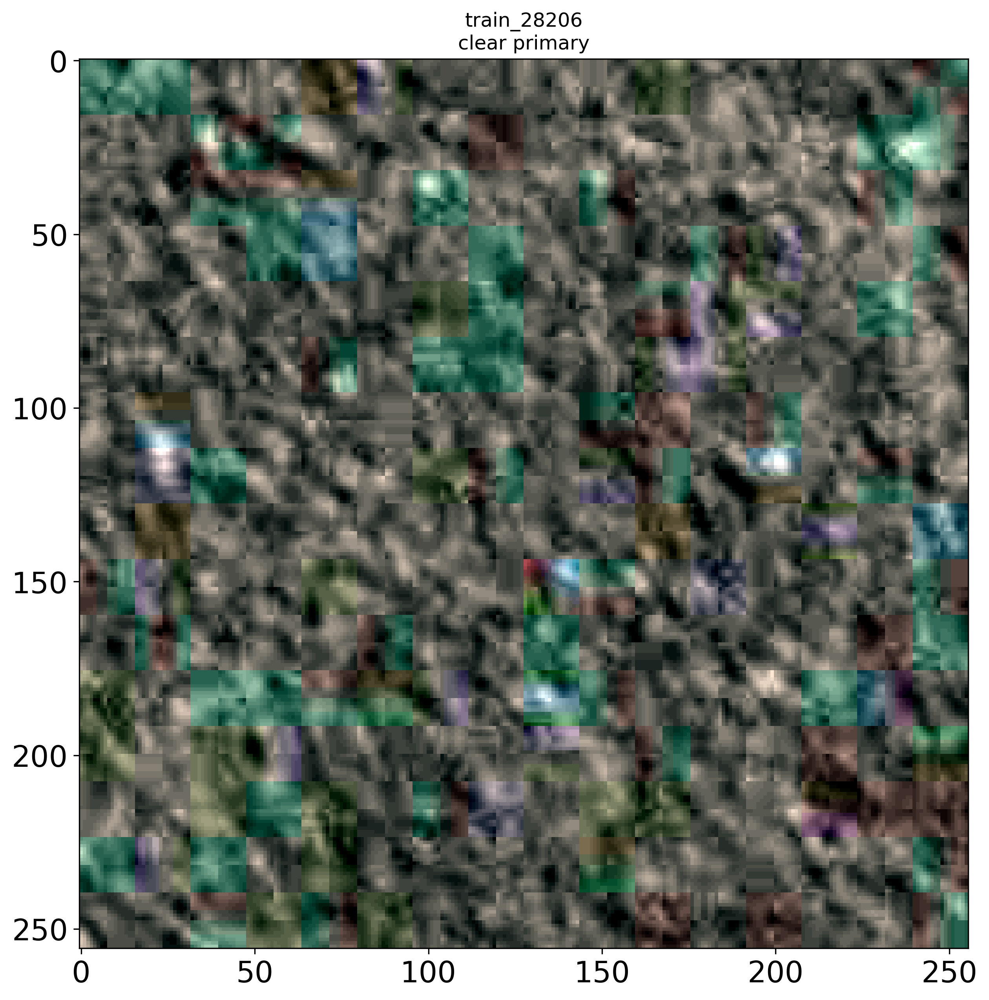

...

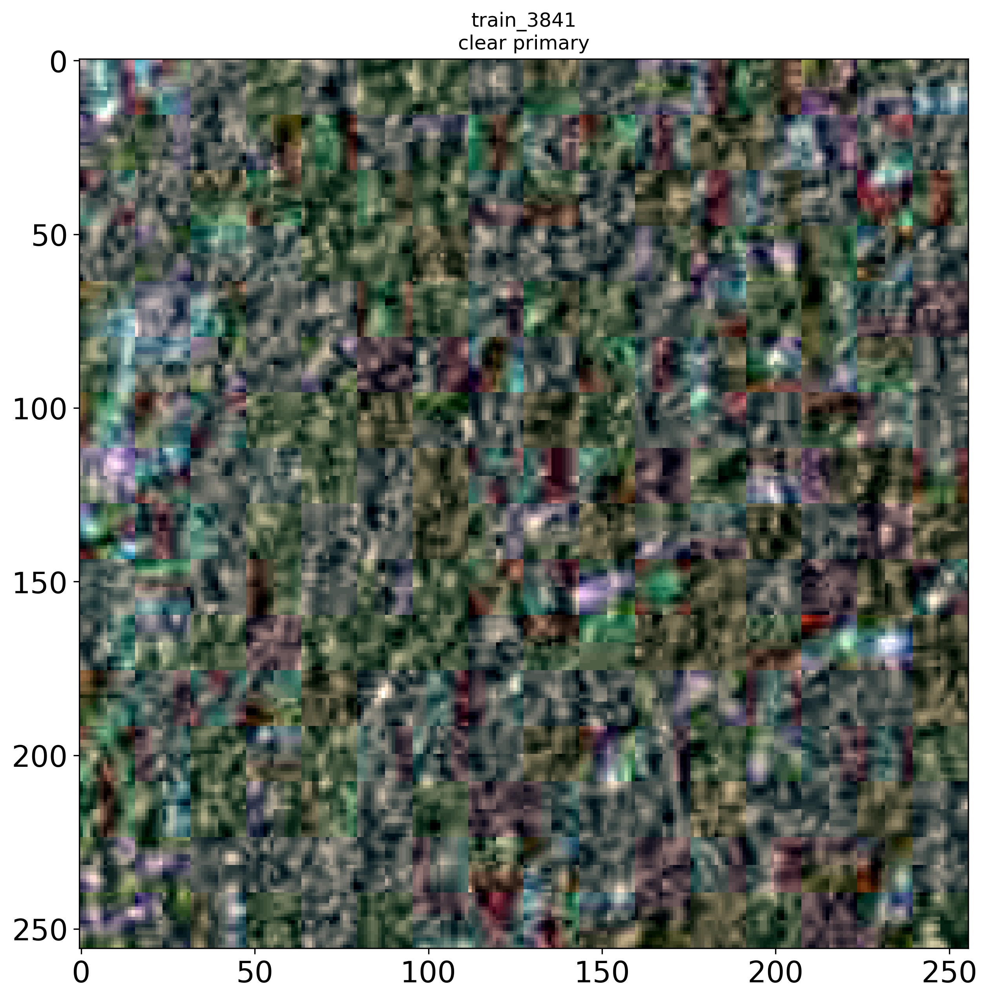

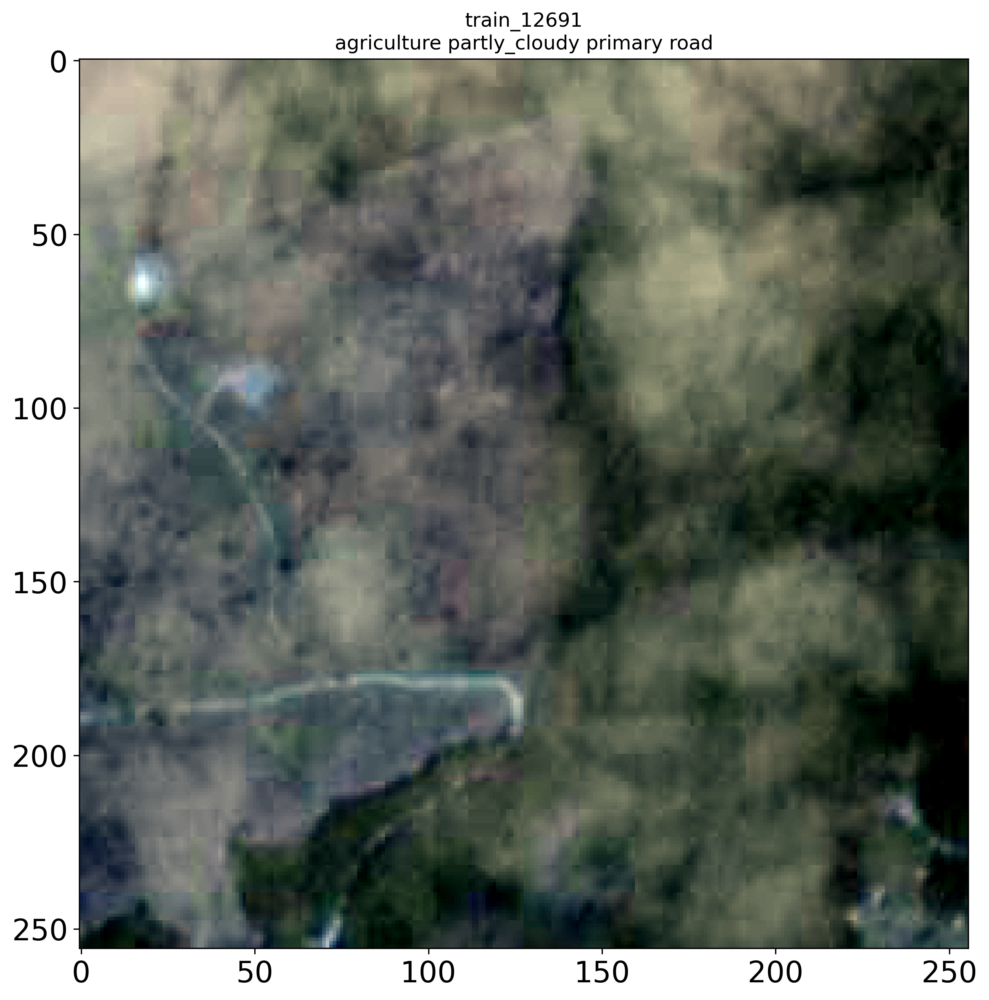

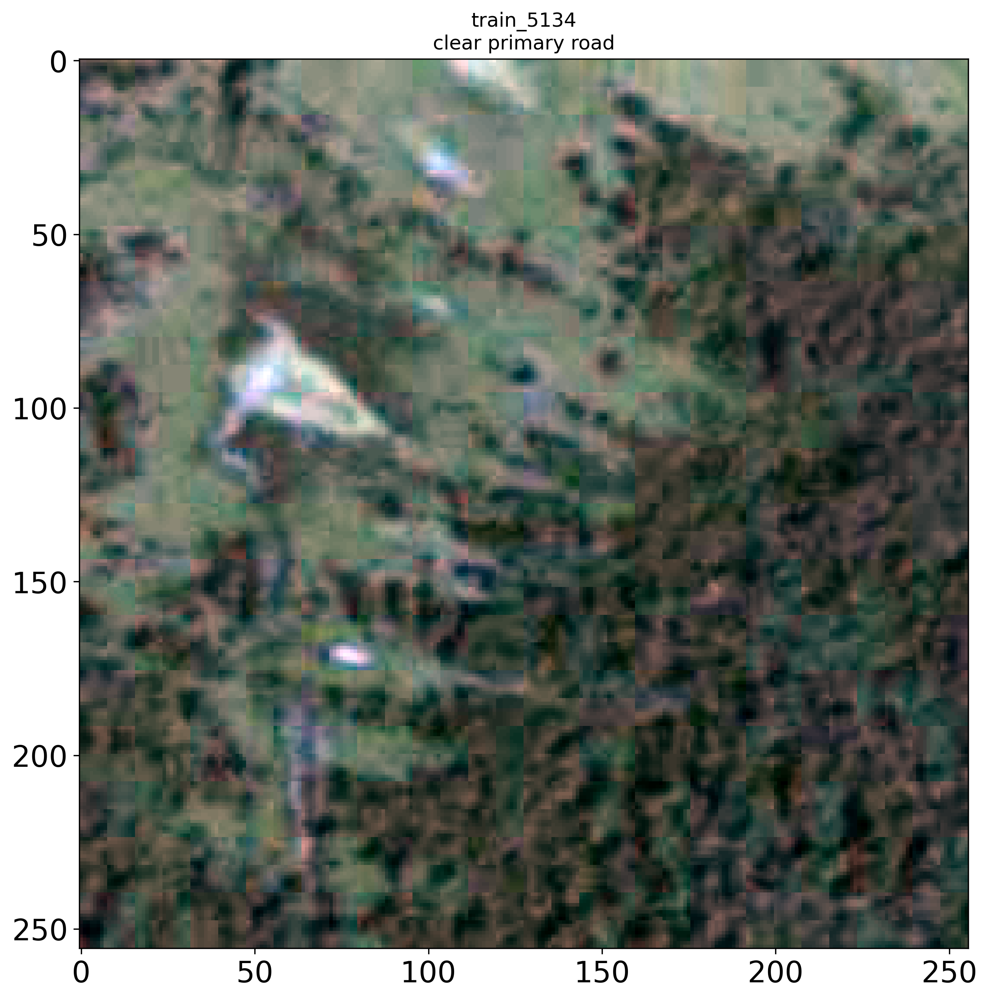

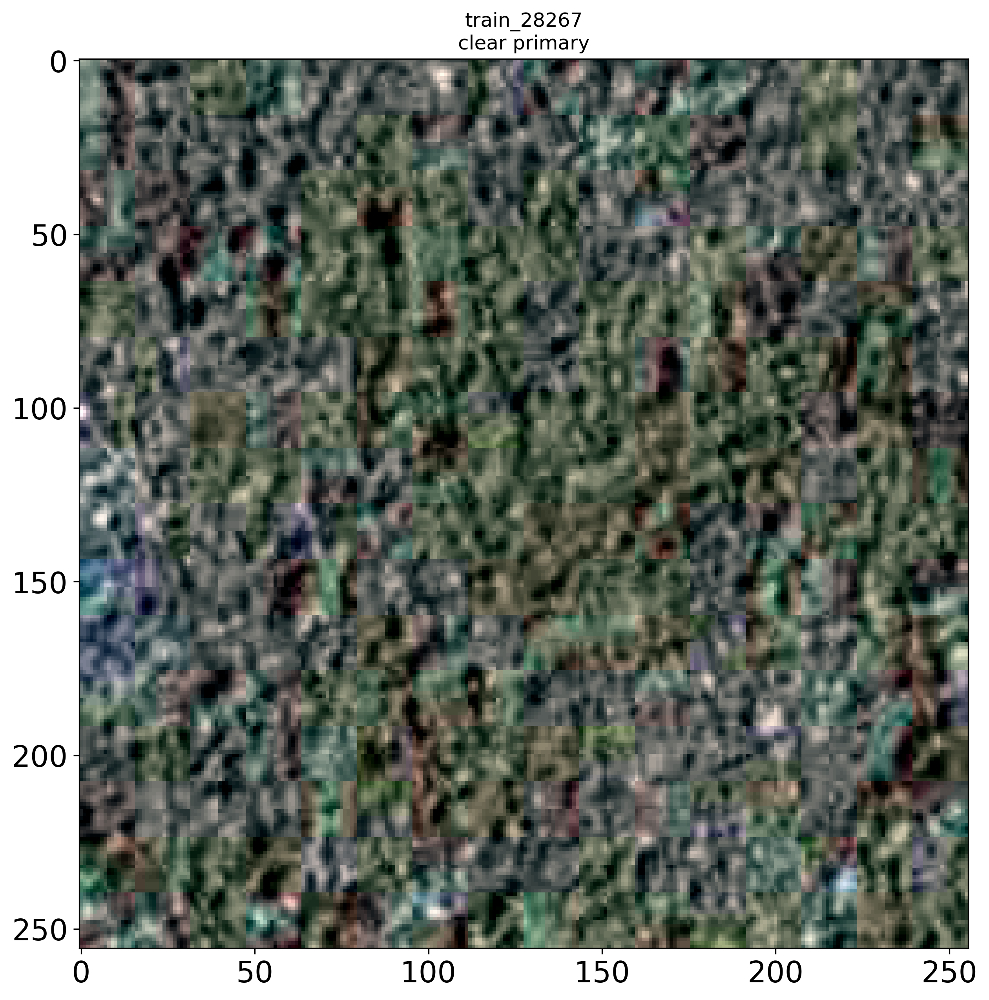

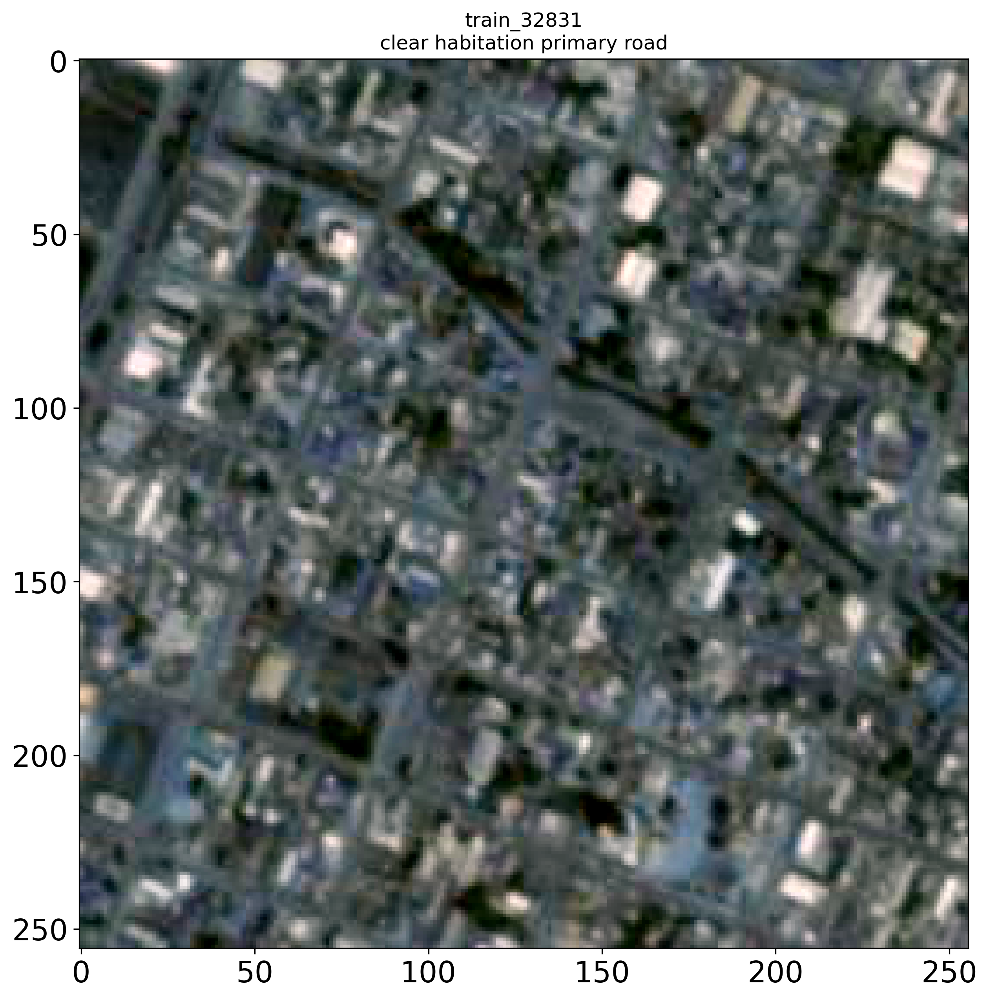

In [30]:
df_train =  df[df['image_name'].isin([x.split('.jpg')[0] for x in data_filenames_img[0]])]
df_train.reset_index(inplace=True)
df_train.drop(['index'], axis=1, inplace=True)
random_imgs = np.random.randint(0,len(df_train), 25)

count = 0
for i in range(4):
    for j in range(4):
        idx = random_imgs[count]
        img_name = df_train.iloc[idx].values[0]
        img_tag = df_train.iloc[idx].values[1]
        img = skimage.io.imread(os.path.join(train_data_dir,'{}.jpg'.format(img_name)))
        bgr = img[:,:,:3]
        rgb = bgr[:, :, [2,1,0]] 
        imshow(calibrate_image(rgb, train_params), title='{}\n{}'.format(img_name, img_tag))
        count += 1

In [31]:
# Unfortunately there wasn't enough time to experiment with 6 channels images

# Create datasets with VI (Vegetation Indices)
#save_train_vi_path = './data/train/vegetation_index/'
#save_val_vi_path = './data/val/vegetation_index/'
#save_test_vi_path = './data/test/vegetation_index/'
#save_vi_paths = [save_train_vi_path, save_val_vi_path, save_test_vi_path]

#for path, set_labels in zip(save_vi_paths, zip(train_val_test, train_val_test_labels)):
#    mkdir(path)
#    str_set = path.split('/')[2]
#    write_vi_TFRdataset(path, str_set, set_labels[0], train_params)
#    write_vi_TFRdataset(path, str_set + '_labels', set_labels[1], train_params, image=False)

In [327]:
# Test reading saved VI datasets
# Read VI datasets
# Initialize tensors
#train_vi_labels = tf.zeros(shape=(len(tags), len(train_filenames)))
#val_vi_labels = tf.zeros(shape=(len(tags), len(val_filenames)))
#test_vi_labels = tf.zeros(shape=(len(tags), len(test_filenames)))

#train_vi = tf.zeros(shape=(len(train_filenames), train_params.size, train_params.size, 6))
#val_vi = tf.zeros(shape=(len(val_filenames), train_params.size, train_params.size, 6))
#test_vi = tf.zeros(shape=(len(test_filenames), train_params.size, train_params.size, 6))

#train_val_test_vi = [train_vi, val_vi, test_vi]
#train_val_test_vi_labels = [train_vi_labels, val_vi_labels, test_vi_labels]

# Loop over and parse datasets
#for path, set_labels in zip(save_vi_paths, zip(train_val_test_vi, train_val_test_vi_labels)):
#    str_set = path.split('/')[2]
#    _set = set_labels[0]
#    labels = set_labels[1]
#    _set = read_TFRdataset(path, str_set)
#    labels = read_TFRdataset(path, str_set + '_labels')

#train_val_test_vi = [train_vi, val_vi, test_vi]
#train_val_test_vi_labels = [train_vi_labels, val_vi_labels, test_vi_labels]

#print('Training set (num_channels = 6) shape (num_samples, img_width, img_height, num_channels): {}'.format(train_vi.shape))
#print('Training labels set (num_channels = 6) shape (num_samples, num_classes): {} \n'.format(train_vi_labels.shape))

#print('Validation set (num_channels = 6) shape (num_samples, img_width, img_height, num_channels): {}'.format(val_vi.shape))
#print('Validation labels set (num_channels = 6) shape (num_samples, num_classes): {} \n'.format(val_vi_labels.shape))

#print('Test set (num_channels = 6) shape (num_samples, img_width, img_height, num_channels): {}'.format(val_vi.shape))

#print('Test labels set (num_channels = 6) shape (num_samples, num_classes): {}'.format(val_vi_labels.shape))

Training set (num_channels = 6) shape (num_samples, img_width, img_height, num_channels): (12750, 128, 128, 6)
Training labels set (num_channels = 6) shape (num_samples, num_classes): (17, 12750) 

Validation set (num_channels = 6) shape (num_samples, img_width, img_height, num_channels): (5465, 128, 128, 6)
Validation labels set (num_channels = 6) shape (num_samples, num_classes): (17, 5465) 

Test set (num_channels = 6) shape (num_samples, img_width, img_height, num_channels): (5465, 128, 128, 6)
Test labels set (num_channels = 6) shape (num_samples, num_classes): (17, 5465)


# Models

## Baseline Models

I approached to this project with the idea of maximising learnings on deep learning, tensorflow, and remote sensing. Trades off were necessary due to time constraints and priorities, however my goal was to be able to familiarize with different levels of implementation of the model pipeline. I started with Keras API ImageDataGenerator, moving to tf.data, and finally experimenting with lower level Tensorflow (2.4.1), implementing training and evaluation steps. Eager execution was active, as this project is not meant to go into production. No GPUs or TPUs were used for training or prediction.

In [32]:
cm_writer = tf.summary.create_file_writer(log_cm_path + '/cm')

In [849]:
#tf.profiler.experimental.stop()

Exp: 
- Set: 30% of the orginal dataset
- Baseline models

In [844]:
# create lists of filenames, labels and filenames_img for train, val, test set (default percentage 100% of dataset)
train_val_test, train_val_test_labels, data_filenames_img = create_filenames_labels(df, pcg_dataset=0.3)

3it [00:05,  1.87s/it]
3it [00:00, 121.20it/s]


Total number of samples (train + val + test) (30 % of original dataset) : 12143
Training set - number of samples: 7649
Validation set - number of samples: 3279
Test set - number of samples: 1215
Training set - number of samples in .data/train: 7650
Validation set - number of samples .data/val: 3280
Test set - number of samples .data/test: 1216


In [845]:
# Baseline model
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   opt_type='SGD_momentum',
                                   preprocess=False,
                                    rlronplateau=False
                                  )

In [846]:
train_dataset = create_dataset(True, train_val_test[0], train_val_test_labels[0], train_params)
val_dataset = create_dataset(False, train_val_test[1], train_val_test_labels[1], train_params)
test_dataset = create_dataset(False, train_val_test[-1], train_val_test_labels[-1], test_params)

In [847]:
X_test, y_test = next(iter(test_dataset))

Version: v1.0
Epoch 1/4
60/60 [==============================] - 231s 4s/step - loss: 0.6677 - f2_score: 0.3110 - val_loss: 0.6079 - val_f2_score: 0.5962


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


Epoch 2/4
60/60 [==============================] - 224s 4s/step - loss: 0.5864 - f2_score: 0.5960 - val_loss: 0.5227 - val_f2_score: 0.5997
Epoch 3/4
60/60 [==============================] - 220s 4s/step - loss: 0.5045 - f2_score: 0.5913 - val_loss: 0.4524 - val_f2_score: 0.5996
Epoch 4/4
60/60 [==============================] - 218s 4s/step - loss: 0.4416 - f2_score: 0.5944 - val_loss: 0.4057 - val_f2_score: 0.6489


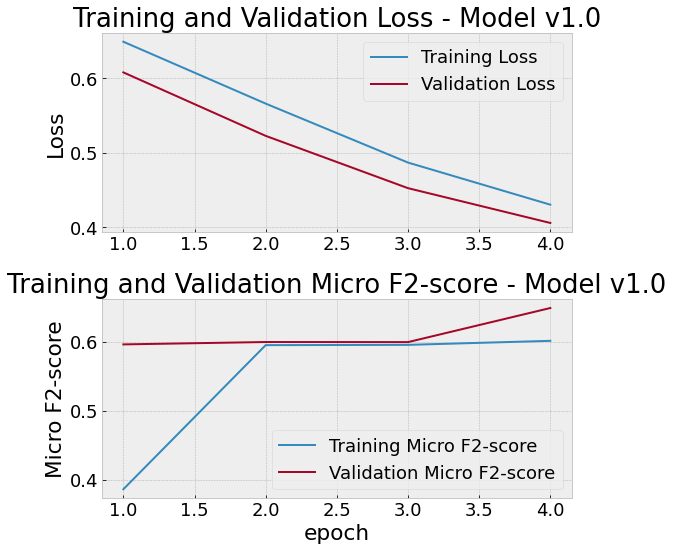

Version: v1.1
Epoch 1/4
60/60 [==============================] - 254s 4s/step - loss: 0.6614 - f2_score: 0.4365 - val_loss: 0.5774 - val_f2_score: 0.5981
Epoch 2/4
60/60 [==============================] - 252s 4s/step - loss: 0.5459 - f2_score: 0.5966 - val_loss: 0.4521 - val_f2_score: 0.6023
Epoch 3/4
60/60 [==============================] - 235s 4s/step - loss: 0.4250 - f2_score: 0.6348 - val_loss: 0.3555 - val_f2_score: 0.6494
Epoch 4/4
60/60 [==============================] - 267s 4s/step - loss: 0.3418 - f2_score: 0.6464 - val_loss: 0.3119 - val_f2_score: 0.6494


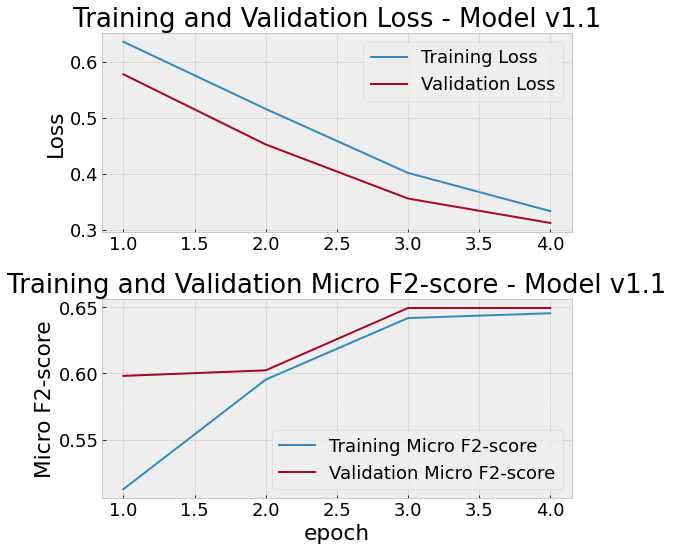

Version: v1.2
Epoch 1/4
60/60 [==============================] - 341s 6s/step - loss: 0.6911 - f2_score: 0.3694 - val_loss: 0.6872 - val_f2_score: 0.5751
Epoch 2/4
60/60 [==============================] - 325s 5s/step - loss: 0.6823 - f2_score: 0.4687 - val_loss: 0.6812 - val_f2_score: 0.6573
Epoch 3/4
60/60 [==============================] - 310s 5s/step - loss: 0.6725 - f2_score: 0.5233 - val_loss: 0.6736 - val_f2_score: 0.6500
Epoch 4/4
60/60 [==============================] - 307s 5s/step - loss: 0.6595 - f2_score: 0.5514 - val_loss: 0.6617 - val_f2_score: 0.6490


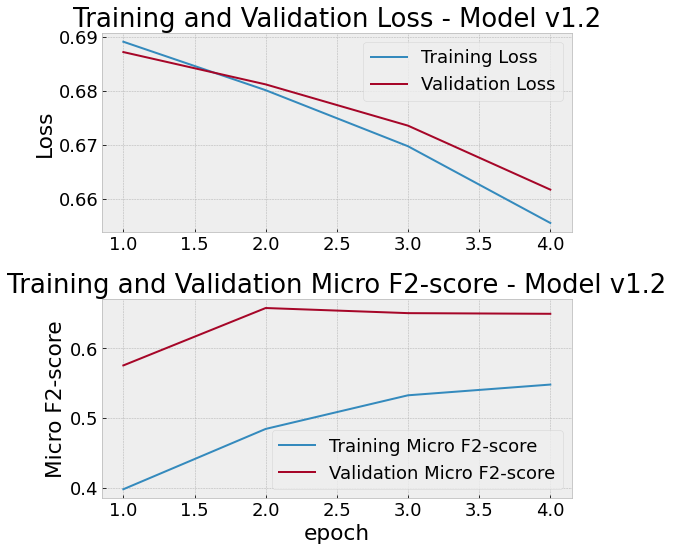

Version: v1.3
Epoch 1/4
60/60 [==============================] - 499s 8s/step - loss: 0.6920 - f2_score: 0.1719 - val_loss: 0.6905 - val_f2_score: 0.1364
Epoch 2/4
60/60 [==============================] - 575s 10s/step - loss: 0.6877 - f2_score: 0.1757 - val_loss: 0.6871 - val_f2_score: 0.1176
Epoch 3/4
60/60 [==============================] - 582s 10s/step - loss: 0.6825 - f2_score: 0.1797 - val_loss: 0.6828 - val_f2_score: 0.1034
Epoch 4/4
60/60 [==============================] - 555s 9s/step - loss: 0.6757 - f2_score: 0.1846 - val_loss: 0.6767 - val_f2_score: 0.0935


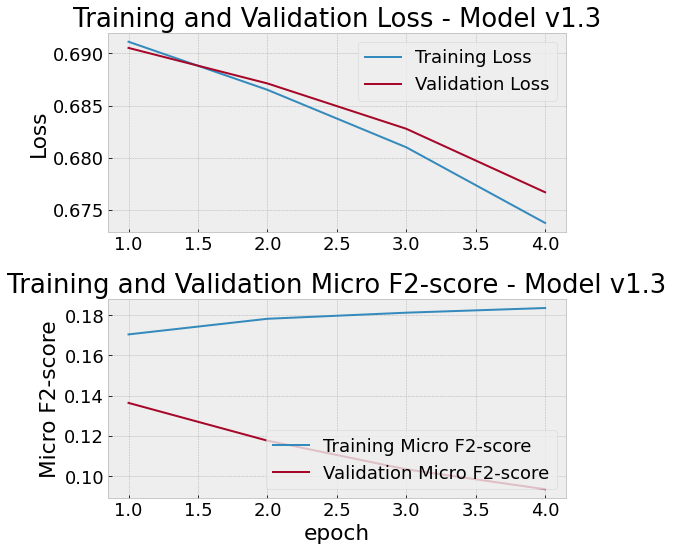

In [851]:
# Warning occurs as erroneously triggered by tf.function retracing warnings when rapidly creating new TF models. https://github.com/tensorflow/tensorflow/issues/42441
versions = ['v1.0', 'v1.1', 'v1.2', 'v1.3']
experiment='_sgd_bcross_30pcgData'
v10111213_sgd_bcross_30pcgData = run_models(versions, train_dataset, val_dataset, X_test, y_test, train_params)

Version: v1.4_sgd_bcross_30pcgData
Epoch 1/4
60/60 [==============================] - 710s 12s/step - loss: 0.6926 - f2_score: 0.3202 - val_loss: 0.6914 - val_f2_score: 0.4061
Epoch 2/4
60/60 [==============================] - 690s 12s/step - loss: 0.6903 - f2_score: 0.3841 - val_loss: 0.6893 - val_f2_score: 0.4263
Epoch 3/4
60/60 [==============================] - 634s 11s/step - loss: 0.6877 - f2_score: 0.4242 - val_loss: 0.6869 - val_f2_score: 0.4190
Epoch 4/4
60/60 [==============================] - 575s 10s/step - loss: 0.6849 - f2_score: 0.4282 - val_loss: 0.6841 - val_f2_score: 0.4062


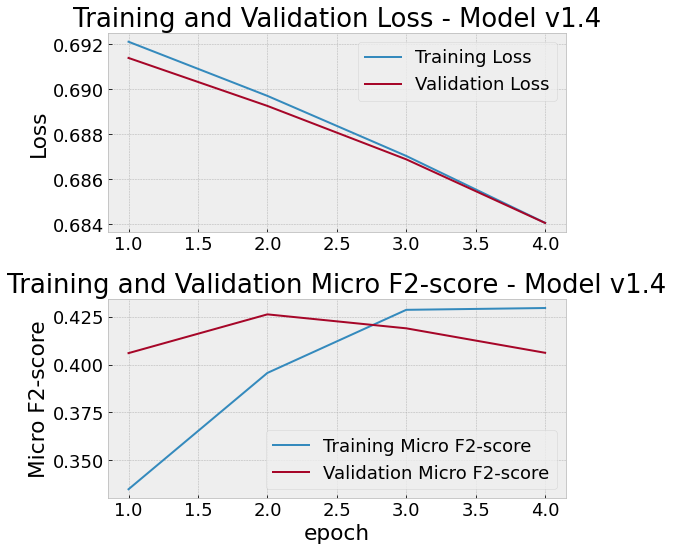

In [852]:
versions = ['v1.4']
experiment='_sgd_bcross_30pcgData'
v14_sgd_bcross_30pcgData = run_models(versions, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

Models show low performance in terms of f2-score, and tend to overfit. We will try focusing on ResNet and iterate from feature extraction mode to fine-tuning, as ResNet should offer better performance.

## ResNet

### Feature extractor

Exp:
- Set: 30% of the original dataset
- Feature extractor

In [853]:
# Feature extractor on 30% data
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   opt_type='Adam',
                                   preprocess=True,
                                    rlronplateau=True,
                                   trainable=False
                                  )


 Using Resnet as feature extractor
Version: Resnet model - ResNet_fex_30pcg
RLRonPlateau: active

Epoch 1/4
60/60 [==============================] - 411s 7s/step - loss: 0.6713 - f2_score: 0.4788 - val_loss: 0.5701 - val_f2_score: 0.5815
Epoch 2/4
60/60 [==============================] - 337s 6s/step - loss: 0.5578 - f2_score: 0.5549 - val_loss: 0.4825 - val_f2_score: 0.6456
Epoch 3/4
60/60 [==============================] - 435s 7s/step - loss: 0.4770 - f2_score: 0.6100 - val_loss: 0.4212 - val_f2_score: 0.6456
Epoch 4/4
60/60 [==============================] - 335s 6s/step - loss: 0.4218 - f2_score: 0.6314 - val_loss: 0.3783 - val_f2_score: 0.6456


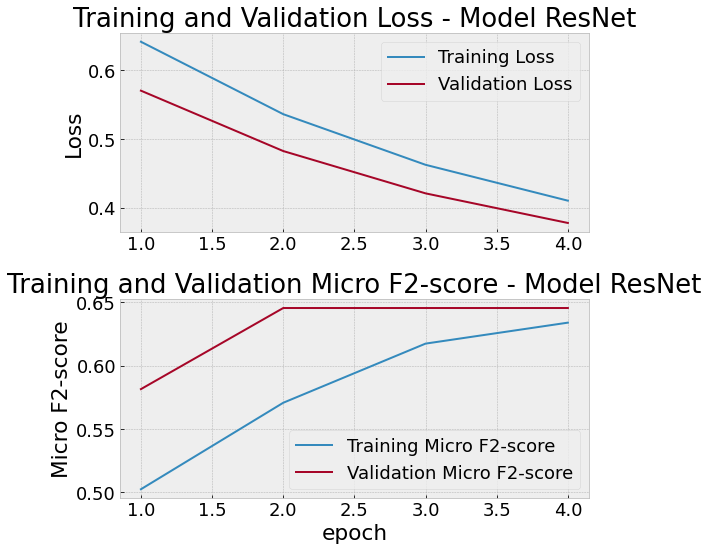

In [854]:
versions_res = ['ResNet']
experiment='_fex_30pcg'
v_resnet_outputs = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

As a feature extractor, performance is not great. It plateaus learning after a few epochs whereas f2-score is still low. Let's try unfreezing top layers to see if it learns more until overfitting.

## Fine-tuning

Exp: 
- Set: 30% of the original dataset
- Unfrozen top layers for fine tuning: 20%

### Using tf.data pipeline

In [855]:
# Fine-tuning on 30% data, 20% unfreeze
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   opt_type='Adam',
                                   preprocess=True,
                                    rlronplateau=True,
                                   trainable=True,
                                   pcg_unfreeze=0.2,
                                  )


 Unfreezing ResNet 20.0% top layers
Version: Resnet model - ResNet_fex_30pcg_unfreeze20pcg
RLRonPlateau: active

Epoch 1/4
60/60 [==============================] - 451s 7s/step - loss: 0.3476 - f2_score: 0.6044 - val_loss: 0.2555 - val_f2_score: 0.6494
Epoch 2/4
60/60 [==============================] - 469s 8s/step - loss: 0.2623 - f2_score: 0.6428 - val_loss: 0.2526 - val_f2_score: 0.6494
Epoch 3/4
60/60 [==============================] - 466s 8s/step - loss: 0.2622 - f2_score: 0.6380 - val_loss: 0.2516 - val_f2_score: 0.6494
Epoch 4/4
60/60 [==============================] - 460s 8s/step - loss: 0.2608 - f2_score: 0.6434 - val_loss: 0.2514 - val_f2_score: 0.6494


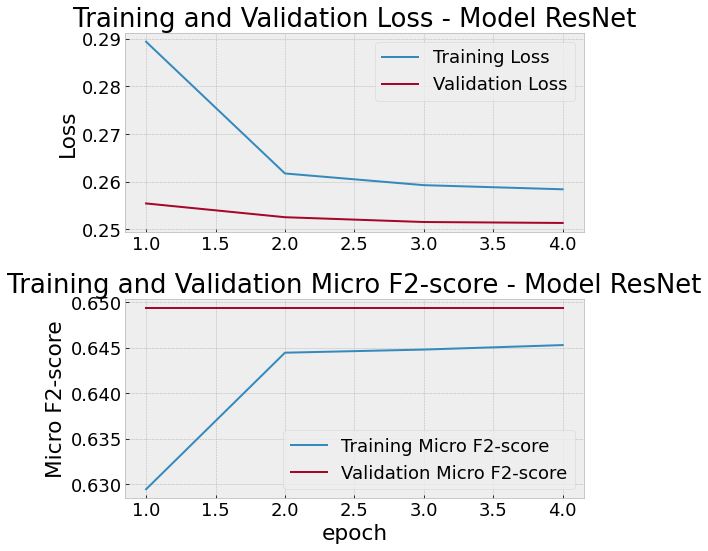

In [856]:
versions_res = ['ResNet']
experiment='_ft_30pcg_unfreeze20pcg'
v_resnet_outputs = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

Exp: 
- Set: 30% of the original dataset
- Unfrozen top layers for fine tuning: 60%

In [857]:
# Fine-tuning on 30% data, 60% unfreeze
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   opt_type='Adam',
                                   preprocess=True,
                                    rlronplateau=True,
                                   trainable=True,
                                   pcg_unfreeze=0.6,
                                  )


 Unfreezing ResNet 60.0% top layers
Version: Resnet model - ResNet_fex_60pcg_unfreeze20pcg
RLRonPlateau: active

Epoch 1/4
60/60 [==============================] - 624s 10s/step - loss: 0.3759 - f2_score: 0.5813 - val_loss: 0.2541 - val_f2_score: 0.6494
Epoch 2/4
60/60 [==============================] - 675s 11s/step - loss: 0.2601 - f2_score: 0.6501 - val_loss: 0.2525 - val_f2_score: 0.6494
Epoch 3/4
60/60 [==============================] - 664s 11s/step - loss: 0.2577 - f2_score: 0.6497 - val_loss: 0.2503 - val_f2_score: 0.6494
Epoch 4/4
60/60 [==============================] - 691s 12s/step - loss: 0.2588 - f2_score: 0.6440 - val_loss: 0.2528 - val_f2_score: 0.6494


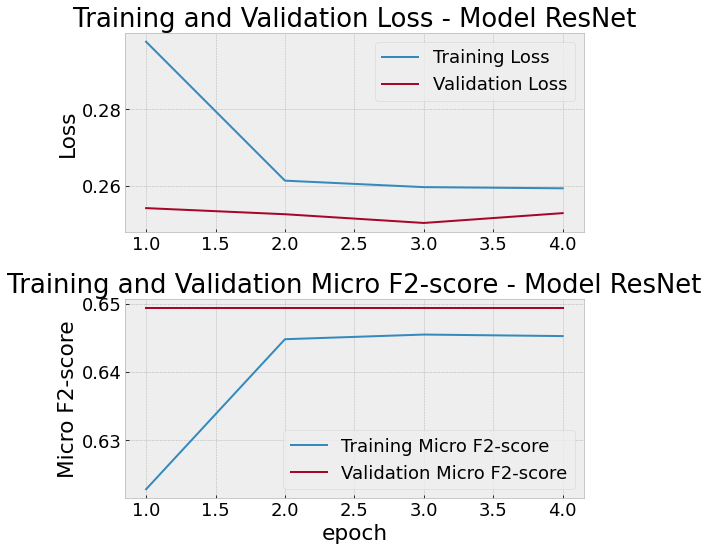

In [858]:
versions_res = ['ResNet']
experiment='_ft_30pcg_unfreeze60pcg'
v_resnet_outputs = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

Model performance is still low, and again it plateaus pretty quickly. Let's use 100% of our dataset until overfitting.

Exp: 
- Set: 100% of the original datset
- Unfrozen top layers for fine tuning: 60%

In [863]:
# create lists of filenames, labels and filenames_img for train, val, test set (default percentage 100% of dataset)
train_val_test, train_val_test_labels, data_filenames_img = create_filenames_labels(df, pcg_dataset=1)

3it [00:18,  6.08s/it]
3it [00:00, 30.12it/s]


Total number of samples (train + val + test) (100 % of original dataset) : 40479
Training set - number of samples: 25501
Validation set - number of samples: 10930
Test set - number of samples: 4048
Training set - number of samples in .data/train: 25502
Validation set - number of samples .data/val: 10931
Test set - number of samples .data/test: 4049


In [867]:
train_dataset = create_dataset(True, train_val_test[0], train_val_test_labels[0], train_params)
val_dataset = create_dataset(False, train_val_test[1], train_val_test_labels[1], train_params)
test_dataset = create_dataset(False, train_val_test[-1], train_val_test_labels[-1], test_params)

In [868]:
X_test, y_test = next(iter(test_dataset))

In [869]:
# Feature extractor on 100% data, 60% unfreeze
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   opt_type='Adam',
                                   preprocess=True,
                                    rlronplateau=True,
                                   trainable=True,
                                   pcg_unfreeze=0.6,
                                  )


 Unfreezing ResNet 60.0% top layers
Version: Resnet model - ResNet_ft_100pcg_unfreeze60pcg
RLRonPlateau: active

Epoch 1/4
200/200 [==============================] - 2452s 12s/step - loss: 0.1956 - f2_score: 0.7748 - val_loss: 0.1019 - val_f2_score: 0.8825
Epoch 2/4
200/200 [==============================] - 2467s 12s/step - loss: 0.0981 - f2_score: 0.8860 - val_loss: 0.0971 - val_f2_score: 0.8863
Epoch 3/4
200/200 [==============================] - 2371s 12s/step - loss: 0.0862 - f2_score: 0.9021 - val_loss: 0.0983 - val_f2_score: 0.8912
Epoch 4/4
200/200 [==============================] - 2699s 14s/step - loss: 0.0771 - f2_score: 0.9112 - val_loss: 0.0974 - val_f2_score: 0.8863


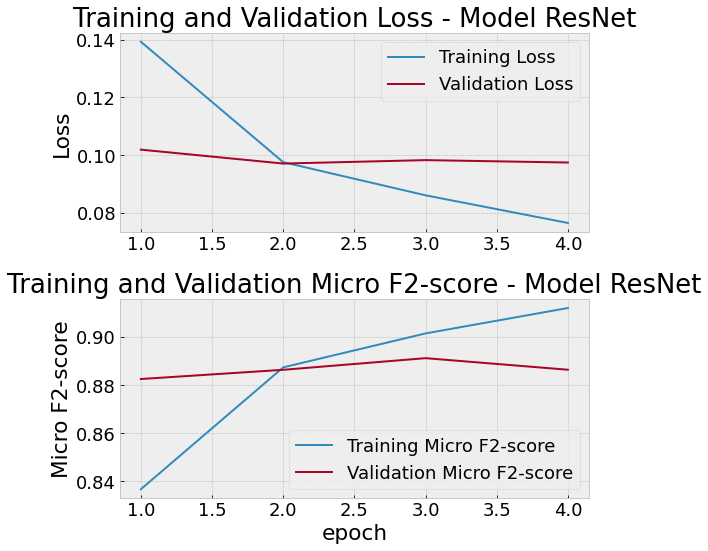

In [871]:
versions_res = ['ResNet']
experiment='_ft_100pcg_unfreeze60pcg'
v_resnet_outputs = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

Our model finally shows improvements, however it overfits after 2 epochs. Let's first check what performance we can reach unfreezing all layers.

Exp: 
- Set: 100% of the original datset
- Full training

In [440]:
train_dataset = create_dataset(True, train_val_test[0], train_val_test_labels[0], train_params)
val_dataset = create_dataset(False, train_val_test[1], train_val_test_labels[1], train_params)
test_dataset = create_dataset(False, train_val_test[-1], train_val_test_labels[-1], test_params)

In [479]:
X_test, y_test = next(iter(test_dataset))


 Using Resnet - Full training

 Using Keras preprocess_input
Version: Resnet model - ResNet_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata
RLRonPlateau: active

Epoch 1/4
200/200 [==============================] - 3161s 16s/step - loss: 0.2255 - f2_score: 0.7083 - val_loss: 0.1317 - val_f2_score: 0.8197
Epoch 2/4
200/200 [==============================] - 3046s 15s/step - loss: 0.1205 - f2_score: 0.8577 - val_loss: 0.1065 - val_f2_score: 0.8684
Epoch 3/4
200/200 [==============================] - 2909s 15s/step - loss: 0.1030 - f2_score: 0.8791 - val_loss: 0.1011 - val_f2_score: 0.8824
Epoch 4/4
200/200 [==============================] - 2947s 15s/step - loss: 0.0922 - f2_score: 0.8951 - val_loss: 0.1007 - val_f2_score: 0.8801


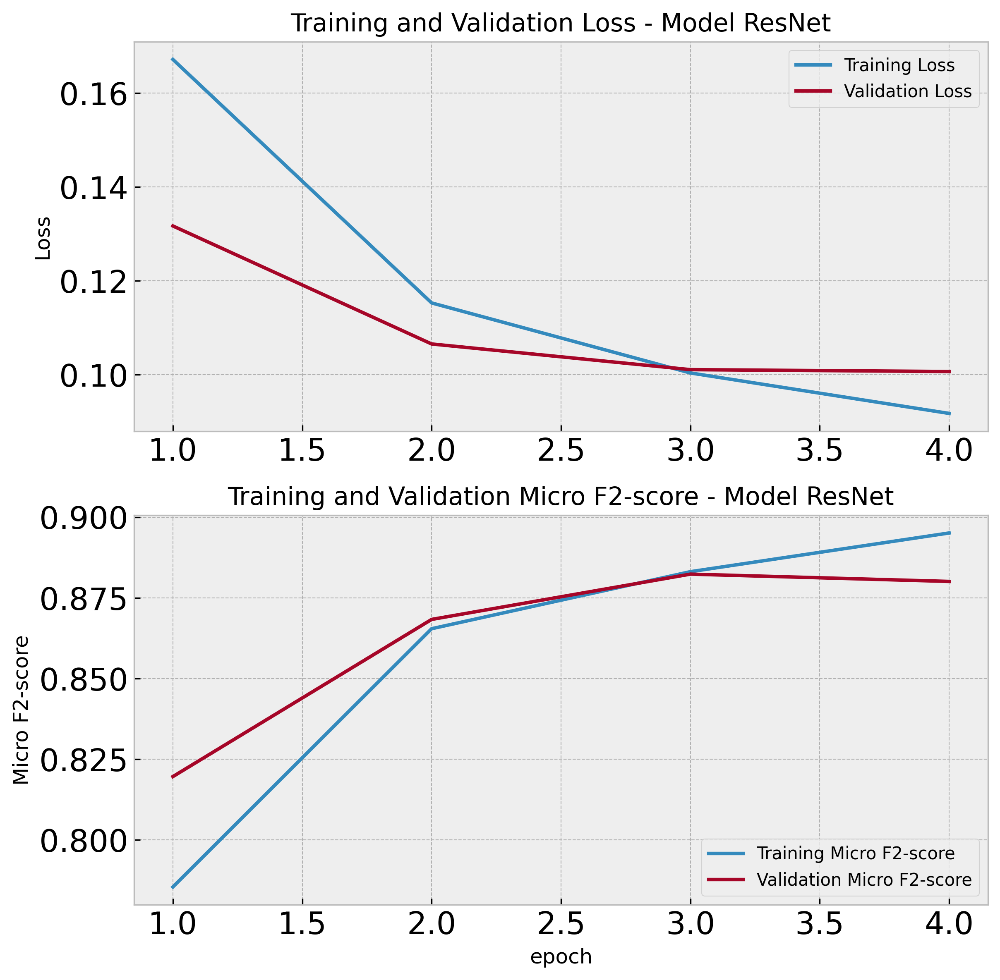

In [443]:
versions_res = ['ResNet']
experiment='_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata'
v_resnet_Admbcross_LRPlt_100pcgData_FullTr_out_tfdata = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

The model shows better performance while overfitting slighlt later. We will now try controlling overfitting with data augmentation first.

Exp: 
- Set: 100% of the original datset
- Full training
- Data augmentation

In [519]:
# Data augmentation
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                   ref_stds=ref_stds,
                        use_random_flip=True,
                            use_90rotation=True,
                         use_elastic_transform=False)

In [520]:
train_dataset = create_dataset(True, train_val_test[0], train_val_test_labels[0], train_params)
val_dataset = create_dataset(False, train_val_test[1], train_val_test_labels[1], train_params)
test_dataset = create_dataset(False, train_val_test[-1], train_val_test_labels[-1], test_params)

In [521]:
X_test, y_test = next(iter(test_dataset))


 Using Resnet - Full training

 Using Keras preprocess_input
Version: Resnet model - ResNet_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata_augmented
RLRonPlateau: active

Epoch 1/4
200/200 [==============================] - 3462s 17s/step - loss: 0.1956 - f2_score: 0.7836 - val_loss: 0.1082 - val_f2_score: 0.8845
Epoch 2/4
200/200 [==============================] - 4876s 24s/step - loss: 0.1023 - f2_score: 0.8843 - val_loss: 0.0976 - val_f2_score: 0.8839
Epoch 3/4
200/200 [==============================] - 4126s 21s/step - loss: 0.0925 - f2_score: 0.8936 - val_loss: 0.0987 - val_f2_score: 0.8823
Epoch 4/4
200/200 [==============================] - 3054s 15s/step - loss: 0.0871 - f2_score: 0.9012 - val_loss: 0.0974 - val_f2_score: 0.8955


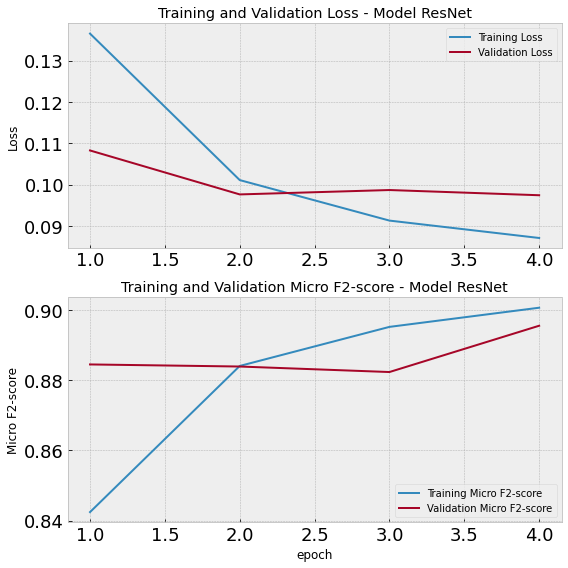

AttributeError: 'AttrDict' object has no attribute 'use_random_saturation'

In [533]:
versions_res = ['ResNet']
experiment='_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata_augmented'
v_resnet_Admbcross_LRPlt_100pcgData_FullTr_out_tfdata_augmented = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

Data agumentation doesn't seem to work as we hoped. We will add l2 regularization.

**Best exp**: 
- Set: 100% of the original datset
- Full training
- Data augmentation
- Regularization 

In [645]:
# Data augmentation and regularization
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   use_random_flip=True,
                                   use_90rotation=True,
                         use_elastic_transform=False,
                                   regularization=True
                                  )


 Using Resnet - Full training

 Using Keras preprocess_input
L2 regularization added
Version: Resnet model - ResNet_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata_augmented_reg
RLRonPlateau: active

Epoch 1/4
200/200 [==============================] - 2900s 14s/step - loss: 0.7318 - f2_score: 0.7882 - val_loss: 0.5643 - val_f2_score: 0.8753
Epoch 2/4
200/200 [==============================] - 2837s 14s/step - loss: 0.5396 - f2_score: 0.8839 - val_loss: 0.4836 - val_f2_score: 0.8810
Epoch 3/4
200/200 [==============================] - 2816s 14s/step - loss: 0.4632 - f2_score: 0.8933 - val_loss: 0.4300 - val_f2_score: 0.8832
Epoch 4/4
200/200 [==============================] - 3090s 15s/step - loss: 0.4135 - f2_score: 0.8974 - val_loss: 0.3939 - val_f2_score: 0.8893


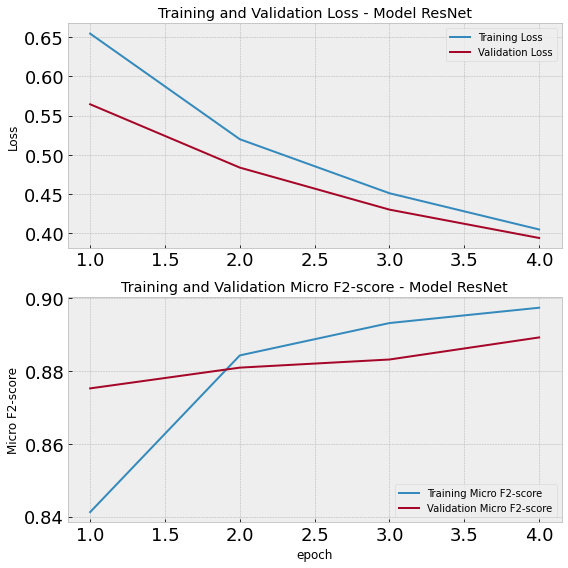

In [655]:
versions_res = ['ResNet']
experiment='_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata_augmented_reg'
v_resnet_reg = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

This is our best model so far. Accuracy is close to 89% while keeping overfitting at bay. Let's plot for each label what are the decision thresholds that maximise f2 scores.

/opt/anaconda3/envs/retinanet/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  app.launch_new_instance()
/opt/anaconda3/envs/retinanet/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  app.launch_new_instance()
/opt/anaconda3/envs/retinanet/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  app.launch_new_instance()
/opt/anaconda3/envs/retinanet/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecati

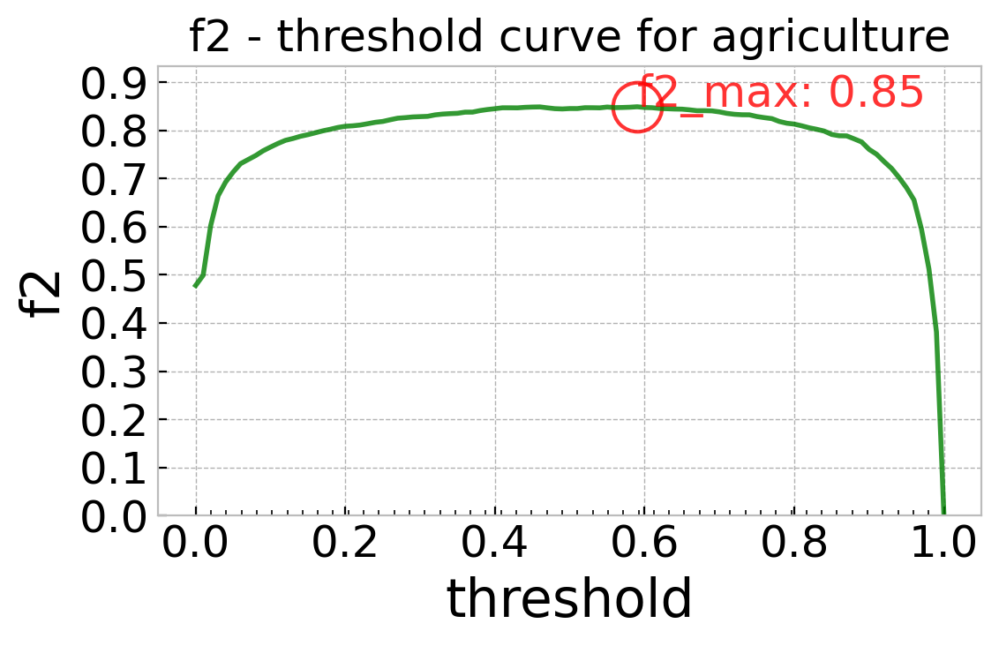

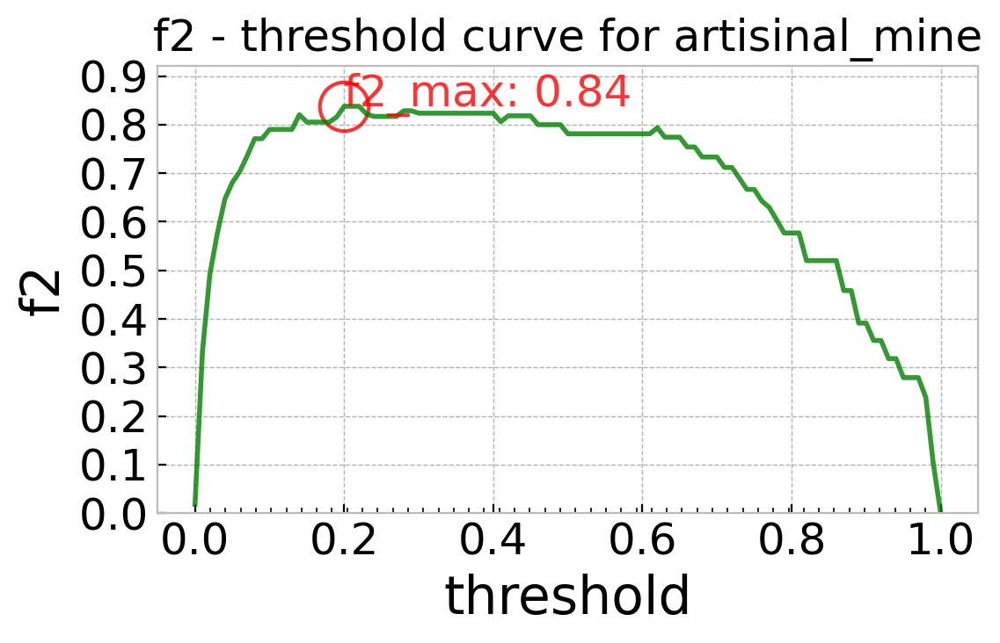

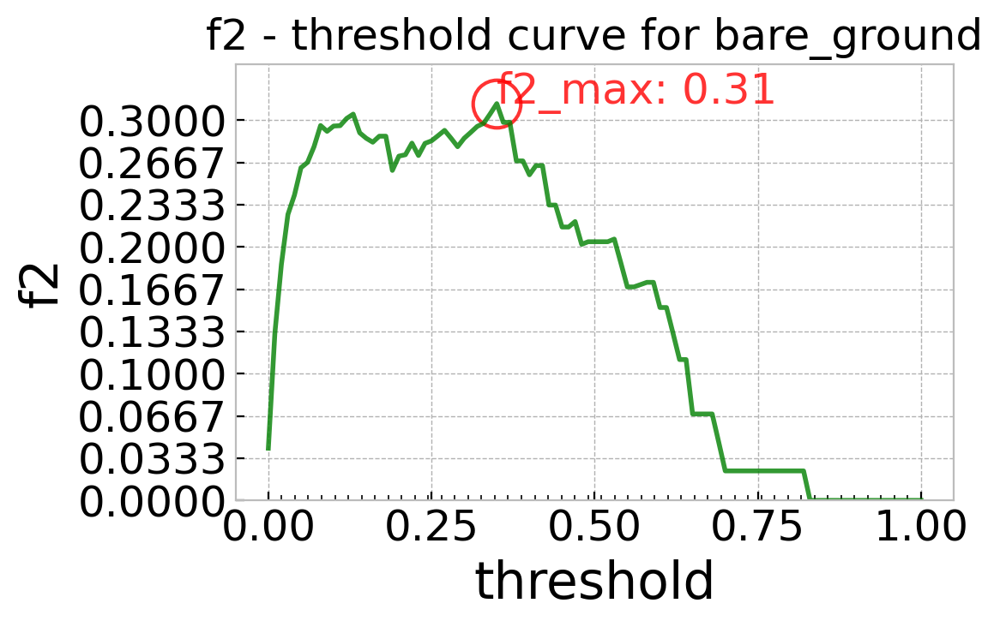

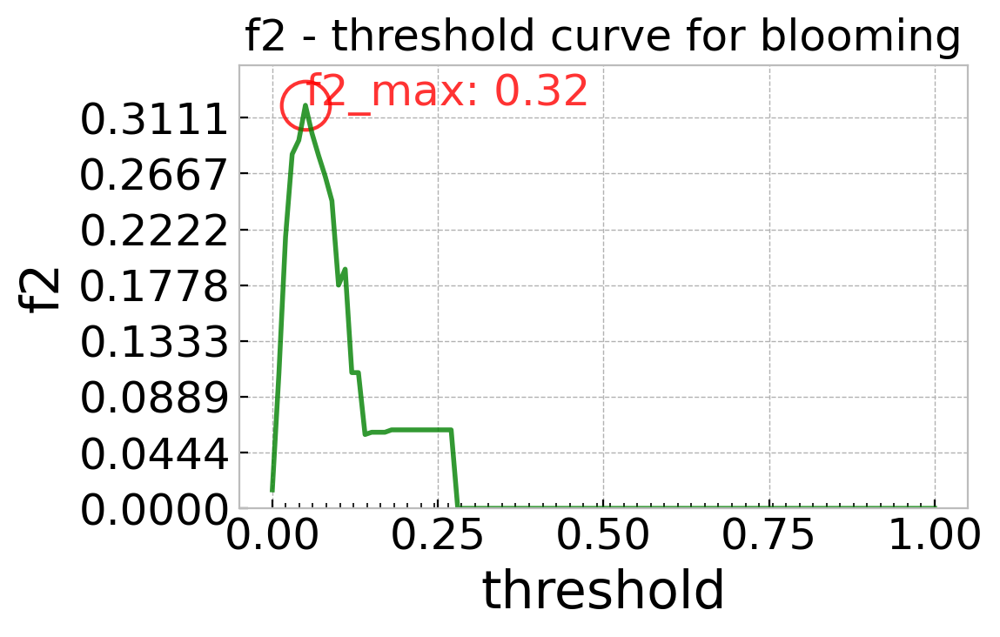

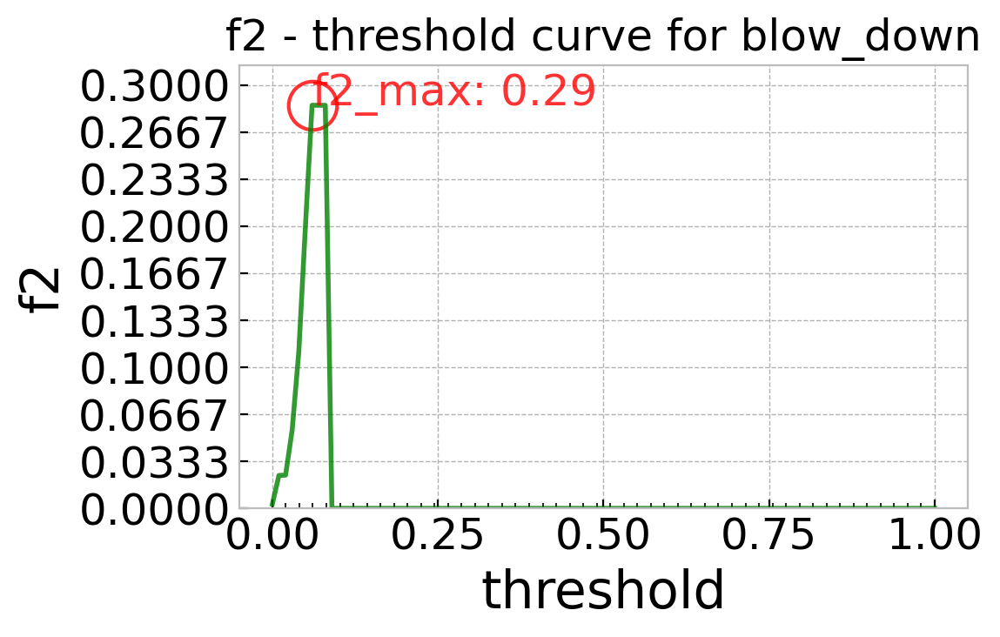

...

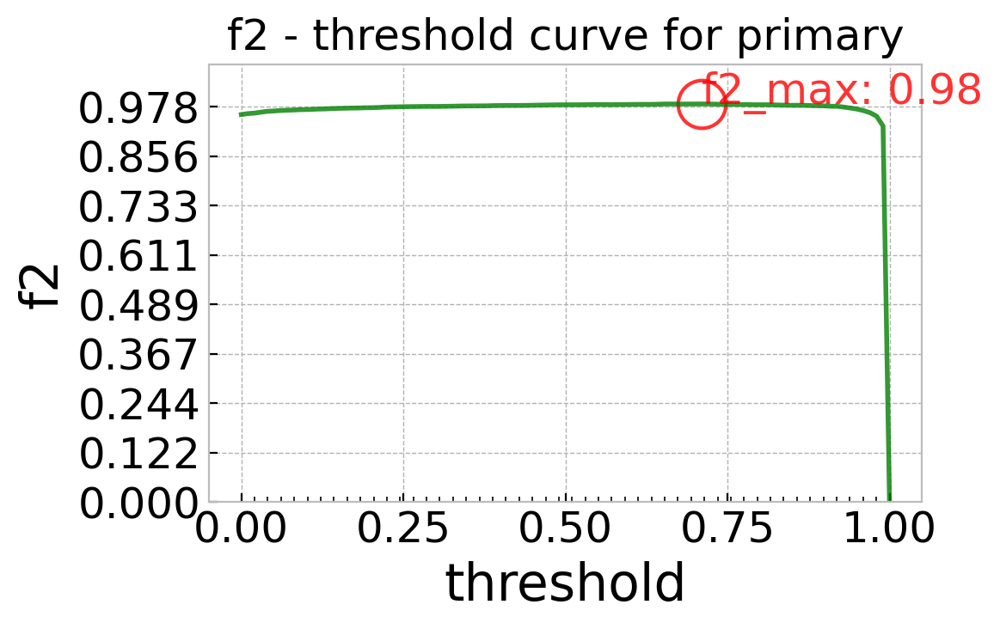

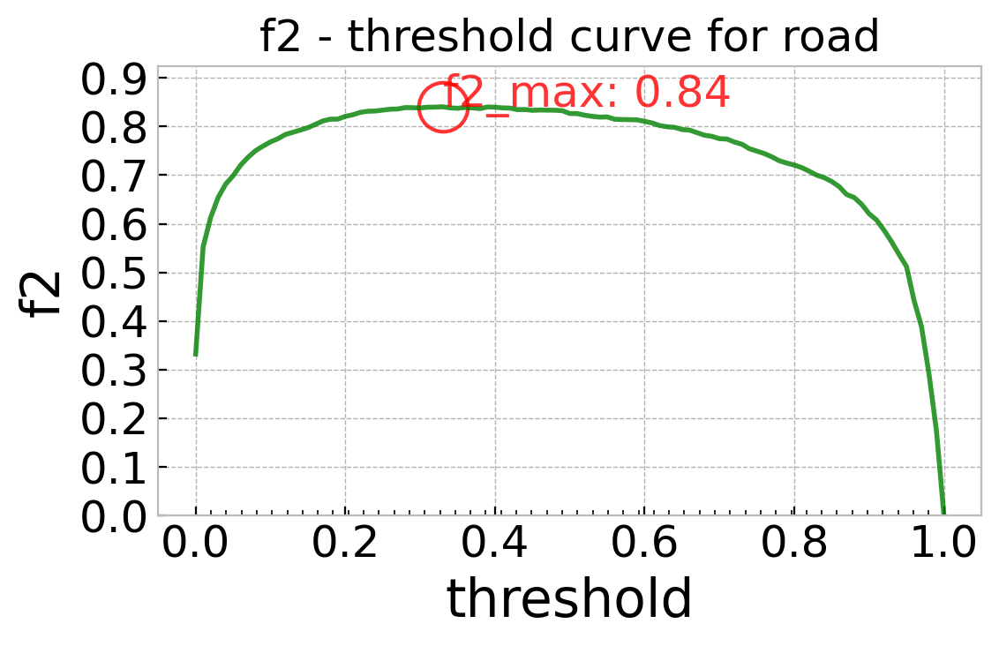

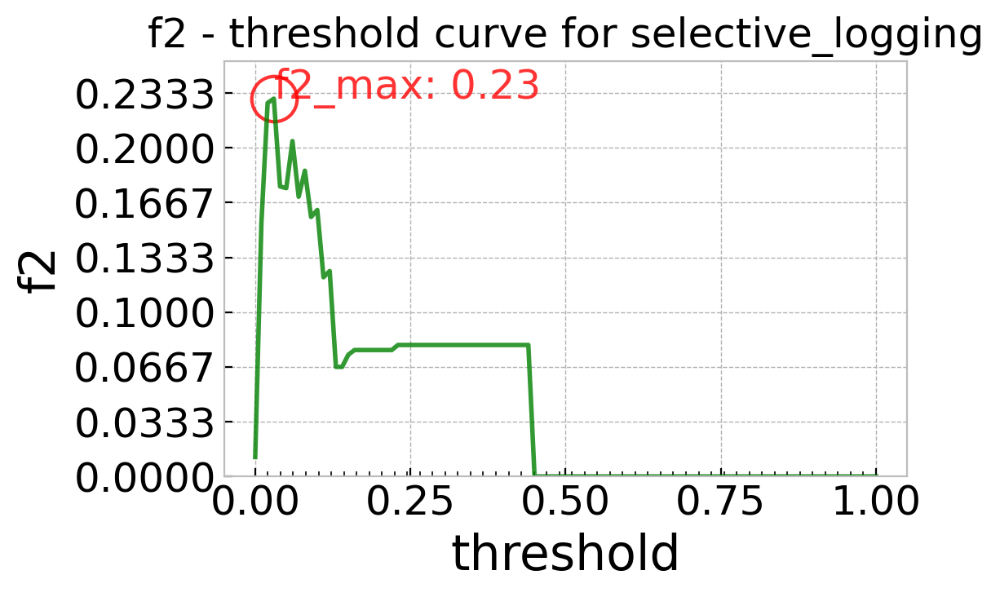

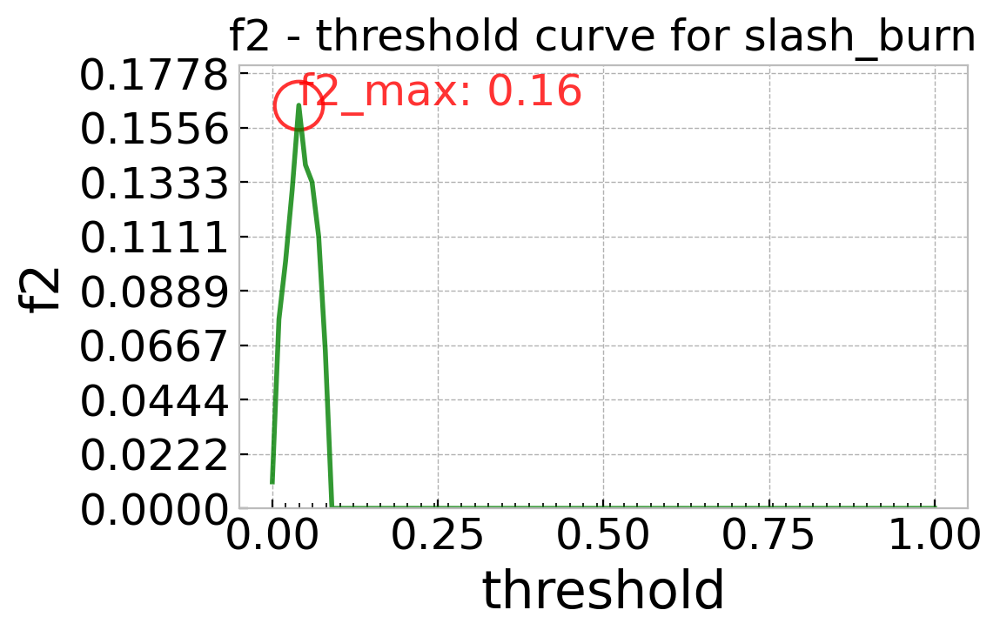

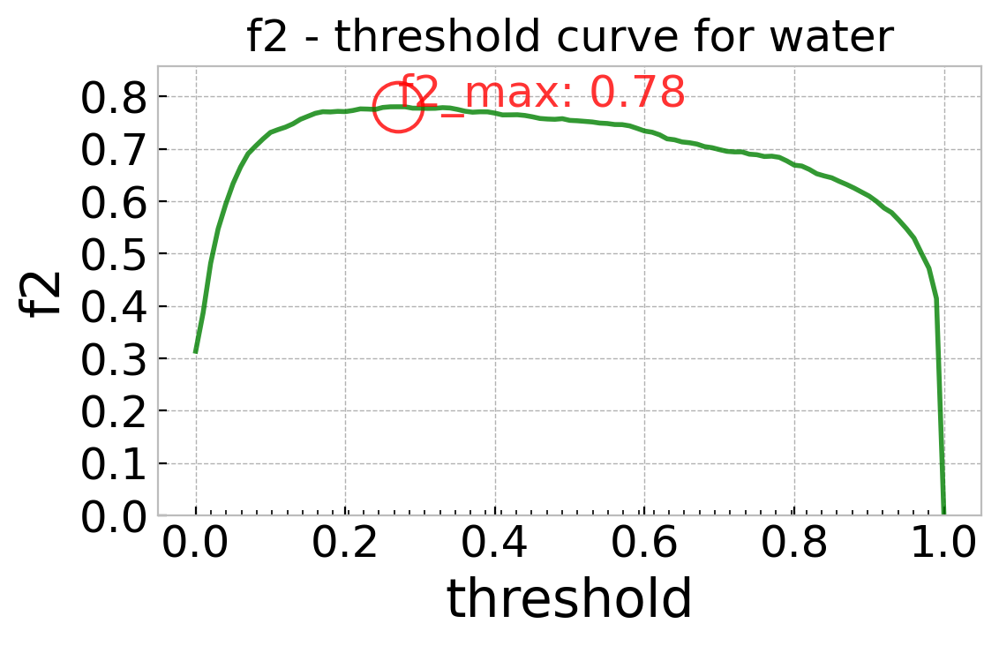

In [824]:
plot_f2_labels(v_resnet_reg, experiment)

In [1031]:
# f2_score result is wrong
loss_test = v_resnet_reg['ResNet']['model'].evaluate(X_test)[0]
test_predictions_v_resnet_reg = v_resnet_reg['ResNet']['model'].predict(X_test)
tf.print('Test f2-score: {}'.format(f2_score(y_test, test_predictions_v_resnet_reg)))
print('Test loss: {}'.format(loss_test))

38/38 [==============================] - 1s 22ms/step - loss: 0.2980 - f2_score: 0.0000e+00
Test f2-score: 0.8949017878079385
Test loss: 0.2980310916900635


In [1048]:
df_max_f2_label(v_resnet_reg)

,id,label,freq,threshold,tp,fn,fp,precision,recall,f2
59,0,agriculture,0.31,0.59,1114,157,239,0.823356,0.876475,0.849085
121,1,artisinal_mine,0.01,0.20,31,6,6,0.837838,0.837838,0.837838
237,2,bare_ground,0.02,0.35,18,67,12,0.600000,0.211765,0.313043
308,3,blooming,0.01,0.05,13,17,38,0.254902,0.433333,0.320988
410,4,blow_down,0.00,0.06,1,5,0,1.000000,0.166667,0.285714
558,5,clear,0.70,0.53,2736,83,102,0.964059,0.970557,0.967297
648,6,cloudy,0.06,0.42,191,39,25,0.884259,0.830435,0.856502
718,7,conventional_mine,0.00,0.11,5,3,0,1.000000,0.625000,0.769231
841,8,cultivation,0.12,0.33,287,197,185,0.608051,0.592975,0.600418
931,9,habitation,0.09,0.22,260,118,131,0.664962,0.687831,0.676203


In [1047]:
pd.DataFrame.to_csv(df_max_f2_label(v_resnet_reg), './reports/assets/ResNet_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata_augmented_reg_f2_max.csv')

In [793]:
%tensorboard --logdir './reports/logs/ResNet_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata_augmented_reg'

In [835]:
results_to_file(v_resnet_reg, experiment)

INFO:tensorflow:Assets written to: ./reports/saved_models/ResNet_adam_bcross_LRPlateau_100pcgData_FullTr_tfdata_augmented_reg/assets


Based on our last best performing model, we will try using soft-f2 loss instead of binary crossentropy.

Exp: 
- Set: 100% of the original datset
- Full training
- Data augmentation
- Regularization 
- Loss: soft f2

In [1044]:
# Experiment with Soft f2-loss 
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   use_random_flip=True,
                                   use_90rotation=True,
                         use_elastic_transform=False,
                                   regularization=True,
                                   loss_type='soft_f2'
                                  )


 Using Resnet - Full training

 Using Keras preprocess_input
L2 regularization added
Version: Resnet model - ResNet_adam_softf2_LRPlateau_100pcgData_FullTr_tfdata_augmented_reg
RLRonPlateau: active

Epoch 1/4
200/200 [==============================] - 2587s 13s/step - loss: 0.7786 - f2_score: 0.7723 - val_loss: 0.6918 - val_f2_score: 0.7672
Epoch 2/4
200/200 [==============================] - 2679s 13s/step - loss: 0.6958 - f2_score: 0.7426 - val_loss: 0.6962 - val_f2_score: 0.6881
Epoch 3/4
200/200 [==============================] - 2886s 14s/step - loss: 0.6842 - f2_score: 0.6856 - val_loss: 0.6626 - val_f2_score: 0.6688
Epoch 4/4
200/200 [==============================] - 2564s 13s/step - loss: 0.6468 - f2_score: 0.6739 - val_loss: 0.6220 - val_f2_score: 0.6688


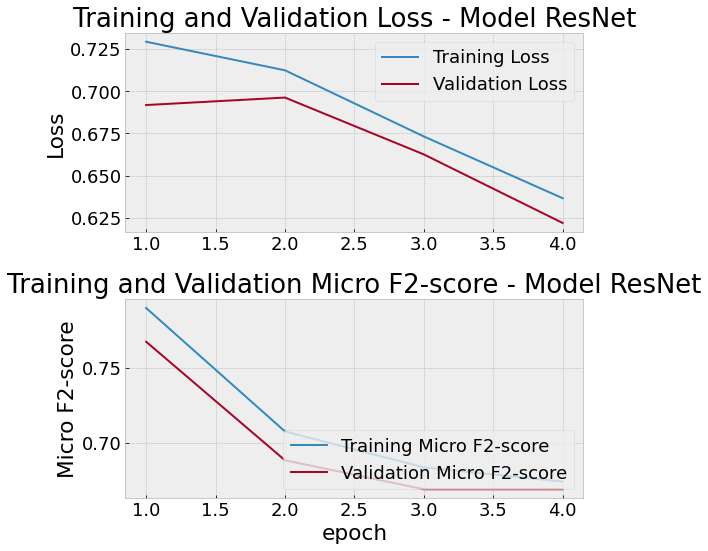

In [1045]:
versions_res = ['ResNet']
experiment='_adam_softf2_LRPlateau_100pcgData_FullTr_tfdata_augmented_reg'
v_resnet_reg_sftf2 = run_models(versions_res, train_dataset, val_dataset, X_test, y_test, train_params, experiment)

The model with soft-f2 loss doesn't show better performance.

As I wanted to experiment also with using Tensorflow at different levels, I added here two examples of
1- Data pipepline using keras ImageDataGenerator
2- Using lower level Tensorflow

### Example of fine-tuning with pipeline using ImageDataGenerator

Exp: 
- Set: 100% of the original dataset
- Unfrozen top layers for fine tuning: 100%

In [13]:
train_data_dir = './data/train'
val_data_dir = './data/val'
test_data_dir = './data/test'
dest_dirs = [train_data_dir, val_data_dir, test_data_dir]

In [15]:
data_generators = load_data_using_keras(dest_dirs, df_4gen, data_filenames_img, train_params)

Found 25501 validated image filenames.
Found 10930 validated image filenames.
Found 4048 validated image filenames.


In [16]:
test_dataset, test_labels = next(iter(data_generators['test']))


 Using Resnet - Full training

 Using Keras preprocess_input
Version: Resnet model - ResNet_adam_soft_F2_LRPlateau_100pcgData_FullTr_preprocessRes
RLRonPlateau: active

Epoch 1/8
199/199 [==============================] - 4179s 21s/step - loss: 0.2157 - f2_score: 0.7331 - val_loss: 0.1414 - val_f2_score: 0.8243
Epoch 2/8
199/199 [==============================] - 4095s 21s/step - loss: 0.1291 - f2_score: 0.8375 - val_loss: 0.1307 - val_f2_score: 0.8258
Epoch 3/8
199/199 [==============================] - 3180s 16s/step - loss: 0.1155 - f2_score: 0.8582 - val_loss: 0.1250 - val_f2_score: 0.8410
Epoch 4/8
199/199 [==============================] - 3047s 15s/step - loss: 0.1046 - f2_score: 0.8665 - val_loss: 0.1270 - val_f2_score: 0.8368
Epoch 5/8
199/199 [==============================] - 2993s 15s/step - loss: 0.0937 - f2_score: 0.8805 - val_loss: 0.1266 - val_f2_score: 0.8543
Epoch 6/8
199/199 [==============================] - 3035s 15s/step - loss: 0.0810 - f2_score: 0.8975 - val_lo

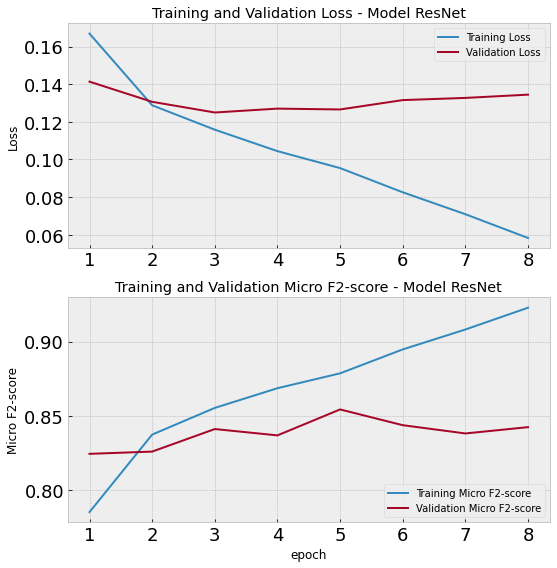

In [966]:
versions_res = ['ResNet']
experiment='_adam_bcross_LRPlateau_100pcgData_FullTr_preprocessRes'
v_resnet_Admbcross_LRPlt_100pcgData_FullTr_out_preprocess = run_models_generator(versions_res, data_generators, test_dataset, test_labels, train_params, experiment)

It is interesting, although it would require further investigations, that the pipeline with ImageDataGenerator using same hyperparameters previously used for one of our experiments, performs worse than the data pipeline with tf.data

## Example of pipeline using lower level Tensorflow

Finally, we implement our best model using lower level Tensorflow. Although requiring further investigations, performance is slighlty improved w.r.t. using Keras with tf.data pipeline.

In [969]:
# create lists of filenames, labels and filenames_img for train, val, test set (default percentage 100% of dataset)
train_val_test, train_val_test_labels, data_filenames_img = create_filenames_labels(df, pcg_dataset=1)

3it [00:22,  7.66s/it]
3it [00:00, 35.69it/s]


Total number of samples (train + val + test) (100 % of original dataset) : 40479
Training set - number of samples: 25501
Validation set - number of samples: 10930
Test set - number of samples: 4048
Training set - number of samples in .data/train: 25502
Validation set - number of samples .data/val: 10931
Test set - number of samples .data/test: 4049


In [970]:
train_dataset = create_dataset(True, train_val_test[0], train_val_test_labels[0], train_params)
val_dataset = create_dataset(False, train_val_test[1], train_val_test_labels[1], train_params)
test_dataset = create_dataset(False, train_val_test[-1], train_val_test_labels[-1], test_params)

In [971]:
X_test, y_test = next(iter(test_dataset))

In [1049]:
# Data augmentation and regularization
train_params, test_params = params(epochs=4,
                                   train_val_test=train_val_test,
                                   ref_means=ref_means,
                                    ref_stds=ref_stds,
                                   use_random_flip=True,
                                   use_90rotation=True,
                         use_elastic_transform=False,
                                   regularization=True
                                  )

In [974]:
model = create_resnet(train_params)

train_loss_epochs = []
train_f2_epochs = []
val_loss_epochs = []
val_f2_epochs = []

for epoch in range(train_params.num_epochs):
    print("\nStart of epoch %d" % epoch)
    start_time = time.time()
    running_loss = 0.0
    for step, (x_batch_train, y_batch_train) in tqdm(enumerate(train_dataset)):

        with tf.GradientTape() as tape:
            # Run the forward pass of the layer.
            # The operations that the layer applies
            # to its inputs are going to be recorded
            # on the GradientTape.
            train_predictions = model(x_batch_train, training=True)
            train_loss = train_params.loss_obj(y_batch_train, train_predictions)
            grads = tape.gradient(train_loss, model.trainable_weights)
            # Run one step of gradient descent by updating
            # the value of the variables to minimize the loss.
            train_params.optimizer_obj.apply_gradients(zip(grads, model.trainable_weights))
            if step % 40 == 0:
                print("Training loss (for one batch) at step %d: %.4f" % (step, float(train_loss)))
                print('Training f2 score: {}'.format(f2_score(y_batch_train, train_predictions)))
                print("\nSeen so far: %s samples\n\n" % ((step + 1) * train_params.batch_size))
            
    # Run a validation loop at the end of each epoch.
    for step, (x_batch_val, y_batch_val) in enumerate(val_dataset):
        val_predictions = model(x_batch_val, training=False)
        val_loss = train_params.loss_obj(y_batch_val, val_predictions)
        # Log every 10 batches.
        if step % 40 == 0:
            print('\nValidation loss (for one batch) at step %d: %.4f' % (step, float(val_loss)))
            print('Validation f2 score: {}'.format(f2_score(y_batch_val, val_predictions)))
            print("\nSeen so far: %s samples\n\n" % ((step + 1) * train_params.batch_size))


    train_loss_epochs.append(train_loss)
    train_f2_epochs.append(f2_score(y_batch_train, train_predictions))
    val_loss_epochs.append(val_loss)
    val_f2_epochs.append(f2_score(y_batch_val, val_predictions))
    

    with train_summary_writer.as_default():
        tf.summary.scalar('loss', train_loss_epochs[-1], step=epoch)
        tf.summary.scalar('f2', train_f2_epochs[-1], step=epoch)

    with test_summary_writer.as_default():
        tf.summary.scalar('loss', val_loss_epochs[-1], step=epoch)
        tf.summary.scalar('f2', val_f2_epochs[-1], step=epoch)

    template = '\nEpoch {}, Train Loss: {}, Train f2 score (mean): {}, Val Loss: {}, Val f2 score (mean): {}\n\n\n\n'
    print(template.format(epoch+1,
                         train_loss_epochs[-1],
                         train_f2_epochs[-1],
                         val_loss_epochs[-1],
                         val_f2_epochs[-1]))

    # Use the model to predict the values from X_test
    test_pred_raw = model.predict(X_test)
    cm = tfa.metrics.MultiLabelConfusionMatrix(num_classes=train_params.num_classes)(y_test, np.where(test_pred_raw > 0.5, 1, 0))
    fig = plt.figure(figsize=(10,20))
    figure = plot_confusion_matrix(cm, train_params.columns)
    cm_image = plot_to_image(figure)

    # Log the confusion matrix as an image summary.
    with test_summary_writer.as_default():
        tf.summary.image("Confusion Matrix", cm_img, step=epoch)

    print("Time taken: %.2fs" % (time.time() - start_time))


 Using Resnet - Full training

 Using Keras preprocess_input
L2 regularization added


0it [00:00, ?it/s]


Start of epoch 0


1it [00:18, 18.68s/it]

Training loss (for one batch) at step 0: 0.7507
Training f2 score: 0.29498088531726924

Seen so far: 128 samples




41it [11:31, 15.38s/it]

Training loss (for one batch) at step 40: 0.1499
Training f2 score: 0.8334325695961026

Seen so far: 5248 samples




81it [22:37, 16.57s/it]

Training loss (for one batch) at step 80: 0.1323
Training f2 score: 0.8480345173360945

Seen so far: 10368 samples




121it [33:25, 15.58s/it]

Training loss (for one batch) at step 120: 0.1065
Training f2 score: 0.8813039048943256

Seen so far: 15488 samples




161it [44:20, 16.29s/it]

Training loss (for one batch) at step 160: 0.1147
Training f2 score: 0.8681429875090385

Seen so far: 20608 samples




200it [54:16, 16.28s/it]



Validation loss (for one batch) at step 0: 0.1378
Validation f2 score: 0.8279257710057915

Seen so far: 128 samples



Validation loss (for one batch) at step 40: 0.1411
Validation f2 score: 0.8146500119826778

Seen so far: 5248 samples



Validation loss (for one batch) at step 80: 0.1065
Validation f2 score: 0.8711380327904124

Seen so far: 10368 samples



Epoch 1, Train Loss: 0.10933637619018555, Train f2 score (mean): 0.881505681755228, Val Loss: 0.09315189719200134, Val f2 score (mean): 0.9055078531308509






0it [00:00, ?it/s]

Time taken: 3672.74s

Start of epoch 1


1it [00:15, 15.19s/it]

Training loss (for one batch) at step 0: 0.1113
Training f2 score: 0.8694146736395914

Seen so far: 128 samples




41it [11:00, 16.19s/it]

Training loss (for one batch) at step 40: 0.1106
Training f2 score: 0.8604797666913349

Seen so far: 5248 samples




81it [21:31, 15.30s/it]

Training loss (for one batch) at step 80: 0.1066
Training f2 score: 0.8747426283311095

Seen so far: 10368 samples




121it [32:10, 15.46s/it]

Training loss (for one batch) at step 120: 0.1327
Training f2 score: 0.8482096311487202

Seen so far: 15488 samples




161it [42:54, 16.48s/it]

Training loss (for one batch) at step 160: 0.0935
Training f2 score: 0.9001265761976895

Seen so far: 20608 samples




200it [53:31, 16.06s/it]



Validation loss (for one batch) at step 0: 0.1255
Validation f2 score: 0.8657326116364354

Seen so far: 128 samples



Validation loss (for one batch) at step 40: 0.1287
Validation f2 score: 0.8503354757236656

Seen so far: 5248 samples



Validation loss (for one batch) at step 80: 0.0896
Validation f2 score: 0.8933121384020676

Seen so far: 10368 samples



Epoch 2, Train Loss: 0.06810133159160614, Train f2 score (mean): 0.9391400719667508, Val Loss: 0.09373051673173904, Val f2 score (mean): 0.8708889937293827






0it [00:00, ?it/s]

Time taken: 3630.38s

Start of epoch 2


1it [00:15, 15.31s/it]

Training loss (for one batch) at step 0: 0.0994
Training f2 score: 0.8915012063772545

Seen so far: 128 samples




41it [10:29, 15.13s/it]

Training loss (for one batch) at step 40: 0.1244
Training f2 score: 0.8662629910148754

Seen so far: 5248 samples




81it [21:00, 17.36s/it]

Training loss (for one batch) at step 80: 0.0809
Training f2 score: 0.914201922390264

Seen so far: 10368 samples




121it [31:26, 14.93s/it]

Training loss (for one batch) at step 120: 0.0907
Training f2 score: 0.901592700319871

Seen so far: 15488 samples




161it [41:20, 14.90s/it]

Training loss (for one batch) at step 160: 0.1020
Training f2 score: 0.8779078133354787

Seen so far: 20608 samples




200it [50:45, 15.23s/it]



Validation loss (for one batch) at step 0: 0.1199
Validation f2 score: 0.8822513340621909

Seen so far: 128 samples



Validation loss (for one batch) at step 40: 0.1115
Validation f2 score: 0.857914195472521

Seen so far: 5248 samples



Validation loss (for one batch) at step 80: 0.0889
Validation f2 score: 0.8949491688594124

Seen so far: 10368 samples



Epoch 3, Train Loss: 0.12099677324295044, Train f2 score (mean): 0.8681648975941485, Val Loss: 0.0884971022605896, Val f2 score (mean): 0.9076675136457745






0it [00:00, ?it/s]

Time taken: 3426.21s

Start of epoch 3


1it [00:13, 13.75s/it]

Training loss (for one batch) at step 0: 0.0714
Training f2 score: 0.9221998909063143

Seen so far: 128 samples




41it [10:03, 14.97s/it]

Training loss (for one batch) at step 40: 0.0814
Training f2 score: 0.9096261278136778

Seen so far: 5248 samples




81it [19:46, 14.49s/it]

Training loss (for one batch) at step 80: 0.0790
Training f2 score: 0.9133800771946492

Seen so far: 10368 samples




121it [29:33, 15.52s/it]

Training loss (for one batch) at step 120: 0.0927
Training f2 score: 0.8942464963389662

Seen so far: 15488 samples




161it [39:32, 16.30s/it]

Training loss (for one batch) at step 160: 0.0873
Training f2 score: 0.9041762693363667

Seen so far: 20608 samples




200it [49:44, 14.92s/it]



Validation loss (for one batch) at step 0: 0.1208
Validation f2 score: 0.8798638019764966

Seen so far: 128 samples



Validation loss (for one batch) at step 40: 0.1132
Validation f2 score: 0.8702448021548133

Seen so far: 5248 samples



Validation loss (for one batch) at step 80: 0.0928
Validation f2 score: 0.8929882940083147

Seen so far: 10368 samples



Epoch 4, Train Loss: 0.1048579141497612, Train f2 score (mean): 0.9118680745135319, Val Loss: 0.0824226662516594, Val f2 score (mean): 0.9051334776334776




Time taken: 3403.14s


<Figure size 720x1440 with 0 Axes>

<Figure size 720x1440 with 0 Axes>

<Figure size 720x1440 with 0 Axes>

<Figure size 720x1440 with 0 Axes>

In [982]:
test_predictions = model.predict(X_test)

In [985]:
tf.print('Test f2 score: {}'.format(f2_score(y_test, test_predictions)))

Test f2 score: 0.8983247126622105


In [988]:
%tensorboard --logdir './reports/logs'